# Project Milestone 5
# Topic: CNC Machining
# Group #72

To see table of contents, view the notebook in JupyterLab

# 1. Introduction

[Link to Data source](https://github.com/boschresearch/CNC_Machining/tree/main)

CNC milling machines are critical to metalworking industries, performing versatile tasks such as cutting, drilling, and shaping metal parts. However, machine downtime due to tool failures or defective operations can significantly disrupt production, leading to costly delays. This project leverages time-series data from 3-axis accelerometers mounted on CNC milling machines to detect anomalies that may indicate potential failures, enabling early intervention to minimize downtime.

## 1.1 Problem Statement

Can time-series analysis of 3-axis accelerometer data from CNC milling machines be used to predict anomalies or failures that lead to defective parts or machine downtime? The goal is to develop a predictive model that identifies "bad" operations (defective outcomes) with high accuracy, despite the challenges of varying operation durations and imbalanced data.

## 1.2 Exploratory Data Analysis (EDA)

Exploratory data analysis (EDA) revealed that only 70 out of 1.7K operations resulted in defective parts, highlighting a severe class imbalance that complicates anomaly detection. The absence of zero values in the data suggests reliable sensor performance, but varying operation durations (13.4 to 158.7 seconds) necessitate careful preprocessing to standardize inputs or adopt flexible modeling approaches. These insights emphasize the need for robust feature engineering and models tailored to time-series anomaly detection, as early detection of defects can save significant time and resources in production environments.

### 1.2.1 Visualizations

*   Histograms of operation durations showed a wide range, justifying the need for flexible input handling.
*   Plots of acceleration readings over time for "good" vs. "bad" operations revealed higher amplitude spikes in some "bad" cases, supporting amplitude-based feature engineering.
*   Frequency spectra (via FFT) for sample operations indicated distinct patterns in "bad" operations, reinforcing the use of frequency-domain features.

These analytical decisions link to the project goal of early anomaly detection by focusing on features that capture the physical characteristics of machine failures.

### 1.2.2 Key EDA Findings

The dataset comprises 3-axis accelerometer readings from three CNC milling machines, each performing 14 distinct operations, totaling 1.7K operations. The sensors capture 2000 readings per second, with operation durations ranging from 13.4 to 158.7 seconds, resulting in arrays of varying lengths. Acceleration values range between 636 and 6552 units across all axes, with no zero values, indicating consistent sensor functionality. Notably, only 70 operations are labeled "bad," compared to 1630 "good" operations, revealing a significant class imbalance. The lack of timestamps assumes consecutive readings without missing data.

## 1.3 Pre-Processing

 *    ****Standardization of Input Size:**** Due to varying operation durations, one approach is to resample or truncate data to a fixed length for consistent model input. Alternatively, a sliding window approach was considered to accommodate variable lengths, preserving temporal patterns.



 *    ****Frequency Domain Features:**** EDA highlighted the importance of frequency in vibration data. Fast Fourier Transform (FFT) was proposed to extract frequency components, as changes in frequency may indicate tool wear or breakage.



 *    ****Jerk Calculation:**** The rate of change of acceleration (jerk) was identified as a potential feature to capture sudden movements, such as those caused by tool failures.



 * ****Justification:**** These features were chosen based on EDA insights into the time-series nature of the data and the need to detect subtle anomalies in vibration patterns. Frequency and jerk features align with the physical dynamics of CNC operations, where anomalies often manifest as irregular vibrations.

## 1.4 Baseline Model Selection and Justification

### 1.4.1 Model Choice

A heuristic filter was selected as the baseline model, classifying operations as "good" or "bad" based on amplitude (>4750 units) and duration (< 19 seconds) thresholds. This model was chosen for its simplicity, interpretability, and ability to serve as a starting point for evaluating vibration data. It avoids complex assumptions, making it suitable for initial testing on imbalanced time-series data.

### 1.4.2 Training

*    ***Preprocessing:*** Raw accelerometer data was processed to extract amplitude and duration metrics for each operation. No additional transformations (e.g., normalization) were applied at this stage.
* ***Parameters:*** Fixed thresholds (amplitude >4750, duration < 19s) were set based on EDA observations of "bad" operation characteristics.
* ***Evaluation Metrics:*** The model was evaluated using accuracy, precision, recall, and F1-score, with a focus on performance for the minority "bad" class due to class imbalance.

### 1.4.3 Initial Results

The model achieved 95% overall accuracy, with strong performance on "good" operations (97% precision, 98% recall). However, it struggled with "bad" operations (33% precision, 20% recall, 25% F1-score). The confusion matrix showed 1604 correct "good" predictions and 14 correct "bad" predictions, with 56 "bad" cases misclassified as "good." These results align with expectations for a simple heuristic model, given the class imbalance and lack of sophisticated feature engineering.

### 1.4.4 Results Interpretation and Analysis

#### 1.4.4.1 Performance Analysis:
The baseline model’s high overall accuracy (95%) is misleading due to the imbalanced dataset, as it excels at predicting the majority "good" class but performs poorly on the critical "bad" class (25% F1-score). The low recall (20%) for "bad" operations indicates that many defective operations are missed, which is problematic for the goal of early anomaly detection. The confusion matrix confirms that 56 out of 70 "bad" operations were incorrectly classified, underscoring the model’s limitations.

#### 1.4.4.2 Strengths and Weaknesses:

* **Strengths:** The model is computationally efficient, easy to interpret, and provides a clear benchmark for future models. Its high precision and recall for "good" operations demonstrate reliability in identifying normal behavior.
* **Weaknesses:** The model’s reliance on fixed thresholds fails to capture complex temporal patterns in time-series data. It is particularly ineffective for the minority class, likely due to class imbalance and insufficient feature engineering.

#### 1.4.4.3 Proposed Improvements

* ***Address Class Imbalance:*** Techniques like oversampling (e.g., SMOTE), undersampling, or anomaly detection models (e.g., autoencoders) could improve "bad" class performance.
* ***Incorporate Time-Series Models:*** Models like Recurrent Neural Networks (RNNs) or Long Short-Term Memory (LSTM) networks could better capture temporal dependencies in the data.
* ***Enhance Feature Engineering:*** Adding FFT-based frequency features and jerk calculations may improve the model’s ability to detect subtle anomalies.
* ***Iterative Threshold Tuning:*** Dynamic or data-driven thresholds could replace fixed values to adapt to varying operation characteristics.



## 1.5 Data Pipeline

Standardize input sizes via resampling or sliding windows, compute FFT and jerk features, and normalize data to ensure consistency

# 1.6 Models

Explore anomaly detection models (e.g., autoencoders) and time-series models (e.g., LSTM) to address class imbalance and temporal patterns. Trial models, such as Short-Time Fourier Transform (STFT) combined with Convolutional Neural Networks (CNN), show promising results, with ongoing analysis of hot zone features to identify distinguishing characteristics of "good" and "bad" operations.

Focus on F1-score and ROC-AUC, prioritizing "bad" class performance to ensure effective anomaly detection.
Assumptions include reliable sensor data and no missing readings. Parameter tuning and model refinement will be finalized in the next milestone.

Models Evaluated in section 6 and Appendix:

* ANN using RFFT
* Autoencoder ANN using RFFT
* LSTM on Acceleration Data
* Bi-directional LSTM on Acceleration Data
* 1D CNN on Acceleration Data
* Autoencoder 1D CNN
* 2D CNN using STFT
* Autoencoder ANN using FFT
* Autoencoder LSTM on concatenated accelration and frequency data


# 2. Exploratory Data Analysis (EDA)

## 2.1 Imports

In [14]:
import os
import sys
import pickle
from pathlib import Path
from contextlib import redirect_stdout
from io import StringIO
from collections import Counter
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Literal
from IPython.display import clear_output
from scipy.signal import stft, resample
from scipy.fft import rfft, rfftfreq
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, classification_report, confusion_matrix
)
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE
import h5py
import tensorflow as tf
from tensorflow.data import Dataset
from tensorflow.keras import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import (
    Dense, Dropout, LeakyReLU, SimpleRNN, GRU, LSTM, LayerNormalization,
    UpSampling1D, Conv1D, MaxPooling1D, Flatten, BatchNormalization,
    GlobalAveragePooling1D, Bidirectional
)
from tensorflow.keras.metrics import Precision, Recall, AUC
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout,LSTM, RepeatVector, TimeDistributed
import random
from scipy.ndimage import zoom

try:
  import imblearn
except:
  !pip install imblearn
  import imblearn

try:
  import gdown
except:
  !pip install gdown
  import gdown

# file_id = "1NpVQmQlylyOr0JvK74_baBCQa4daxs8b"
# destination = "CNC_Machining_main.zip"

# # Downloading the data and unzipping it in this runtime, fir the file doesnt already exist
# # the > /dev/null 2>&1 is to supress the output
# if not os.path.exists(destination):
#   !gdown --fuzzy "https://drive.google.com/uc?export=download&id=$file_id" -O $destination > /dev/null 2>&1
#   !unzip -q $destination -d /content


## 2.2 Helper functions from original research group

In [2]:
def find_all_h5s_in_dir(s_dir: os.PathLike):
    """
    list all .h5 files in a directory
    """

    fileslist = []
    for root, dirs, files in os.walk(s_dir):
        for file in files:
            if file.endswith(".h5"):
                fileslist.append(file)
    return fileslist


def load_tool_research_data(data_path: os.PathLike, label: Literal["good","bad"], add_additional_label: bool =True):
    """
    load data (good and bad) from the research data storages

    Keyword Arguments:
            data_path {str} -- [path to the directory]
            label {str} -- ["good" or "bad"]
            add_additional_label {bool} -- [if true the labels will be in the form of "Mxx_Aug20xx_OPxx_sampleNr_label" otherwise "label"] (default: True)
            verbose {bool}

        Returns:
            datalist --  [list of the the X samples]
            label --  [list of the the y labels ]
    """
    datalist = []
    data_label = []
    number_empty_folders=0

    # list all .h5 files
    list_paths = find_all_h5s_in_dir(data_path)
    list_paths.sort()

    for element in list_paths:
        # check if additional label needed ("Mxx_Aug20xx_Tool,nrX")
        if add_additional_label:
            add_label = element.split('/')[-1]
            additional_label = add_label[:-3] + "_" + label
        else:
            additional_label = label
        # extract data X and y
        with h5py.File(os.path.join(data_path, element), 'r') as f:
            vibration_data = f['vibration_data'][:]
        datalist.append(vibration_data)
        data_label.append(additional_label)

    return datalist, data_label


def datafile_read(file: os.PathLike, plotting=True):
    """loads and plots the data from the datafile

    Keyword Arguments:
        file {str} -- [path of the file]

    Returns:
        ndarray --  [raw data original]
    """
    with h5py.File(file, 'r') as f:
        vibration_data = f['vibration_data'][:]
    # interpolation for x axis plot
    freq = 2000
    samples_s = len(vibration_data[:, 0]) / freq
    samples = np.linspace(0, samples_s, len(vibration_data[:, 0]))

    # plotting
    if plotting:
        plt.figure(figsize=(20, 5))
        plt.plot(samples, vibration_data[:, 0], 'b')
        plt.ylabel('X-axis Vibration Data')
        plt.xlabel('Time [sec]')
        plt.locator_params(axis='y', nbins=10)
        plt.grid()
        plt.show()
        plt.figure(figsize=(20, 5))
        plt.plot(samples, vibration_data[:, 1], 'b')
        plt.ylabel('Y-axis Vibration Data')
        plt.xlabel('Time [sec]')
        plt.locator_params(axis='y', nbins=10)
        plt.grid()
        plt.show()
        plt.figure(figsize=(20, 5))
        plt.plot(samples, vibration_data[:, 2], 'b')
        plt.ylabel('Z-axis Vibration Data')
        plt.xlabel('Time [sec]')
        plt.locator_params(axis='y', nbins=10)
        plt.grid()
        plt.show()
    return vibration_data

## 2.3 Load and visualize the sensor data

In [3]:
# Add the utils directory to the system path
sys.path.append('content/utils')

# Import data_loader_utils
# import data_loader_utils

# Define dataset parameters
machines = ["M01", "M02", "M03"]
process_names = ["OP00", "OP01", "OP02", "OP03", "OP04", "OP05", "OP06", "OP07", "OP08", "OP09", "OP10", "OP11", "OP12", "OP13", "OP14"]
labels = ["good", "bad"]
path_to_dataset = Path('content/data').absolute()

# Initialize lists for data and labels
X_data = []
y_data = []

# Suppress output during loading
with redirect_stdout(StringIO()):
    for process_name, machine, label in itertools.product(process_names, machines, labels):
        data_path = os.path.join(path_to_dataset, machine, process_name, label)
        if not os.path.exists(data_path) or not os.path.isdir(data_path):
            continue

        data_list, data_label = load_tool_research_data(data_path, label=label)
        X_data.extend(data_list)
        y_data.extend(data_label)

# Print only the final results
print(f"Total samples loaded into X_data: {len(X_data)}")
print(f"Total labels loaded into y_data: {len(y_data)}")

Total samples loaded into X_data: 1702
Total labels loaded into y_data: 1702



Duration Range for Good Data (seconds):
  Minimum: 18.43 seconds
  Maximum: 158.72 seconds
  Average: 53.00 seconds

Duration Range for Bad Data (seconds):
  Minimum: 13.40 seconds
  Maximum: 130.00 seconds
  Average: 40.14 seconds


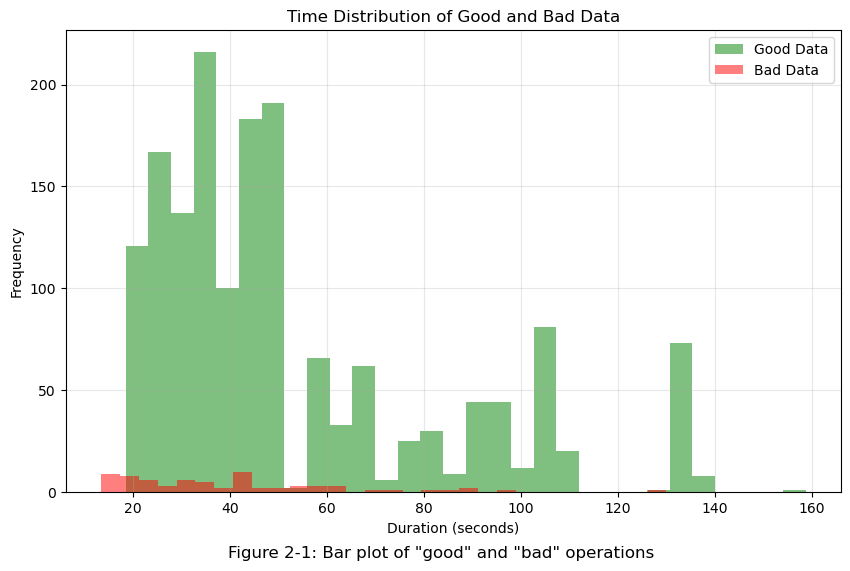

In [4]:
# Sampling frequency
sampling_rate = 2000  # 2 kHz (2000 samples per second)

# Separate good and bad data
good_indices = [i for i, label in enumerate(y_data) if label.endswith("_good")]
bad_indices = [i for i, label in enumerate(y_data) if label.endswith("_bad")]

good_X_data = [X_data[i] for i in good_indices]
bad_X_data = [X_data[i] for i in bad_indices]

# Calculate durations in seconds
good_durations = [len(sample) / sampling_rate for sample in good_X_data]
bad_durations = [len(sample) / sampling_rate for sample in bad_X_data]

# Compute min, max, and average durations
good_min_duration = min(good_durations) if good_durations else 0
good_max_duration = max(good_durations) if good_durations else 0
good_avg_duration = np.mean(good_durations) if good_durations else 0

bad_min_duration = min(bad_durations) if bad_durations else 0
bad_max_duration = max(bad_durations) if bad_durations else 0
bad_avg_duration = np.mean(bad_durations) if bad_durations else 0

# Print the results
print("\nDuration Range for Good Data (seconds):")
print(f"  Minimum: {good_min_duration:.2f} seconds")
print(f"  Maximum: {good_max_duration:.2f} seconds")
print(f"  Average: {good_avg_duration:.2f} seconds")

print("\nDuration Range for Bad Data (seconds):")
print(f"  Minimum: {bad_min_duration:.2f} seconds")
print(f"  Maximum: {bad_max_duration:.2f} seconds")
print(f"  Average: {bad_avg_duration:.2f} seconds")

# Plot the time distribution
plt.figure(figsize=(10, 6))
plt.hist(good_durations, bins=30, alpha=0.5, label='Good Data', color='green')
plt.hist(bad_durations, bins=30, alpha=0.5, label='Bad Data', color='red')
plt.title('Time Distribution of Good and Bad Data')
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)

plt.figtext(0.5, 0.00, 'Figure 2-1: Bar plot of "good" and "bad" operations', ha='center', fontsize=12)

plt.show()

It's evident that the dataset is imbalanced. With 1,632 instances of good data and 70 instances of bad data, the bar chart above illustrates the red areas representing the bad data and the green areas representing the good data. In this duration and frequency bar chart, it appears that most of the data points are below 50 seconds in length.

In the following seciton we further explored the differences between operation times in the following plot. The smallest operation duration was 13.4 seconds and the largest operation duration was 158.7 seconds. Since each operation duration is different, certain decisions need to be made about preprocessing and the architecture of the network.

One approach would be to choose a fixed window of time to break the data into. This methodology would be flexible for a wide range of networks. However, there are difficulties in choosing an appropriate window size that would capture the relationships of the good and bad results. The fixed window may also not generalize well in the case where an anomoly which exceeds tot window is encountered during operation.

Another approach would be to select a network architecture such as an RNN or LSTM which can handle streamed, sequential data and is not bound to a fixed window.

Further exploration into both approaches will be conducted in future milestones.

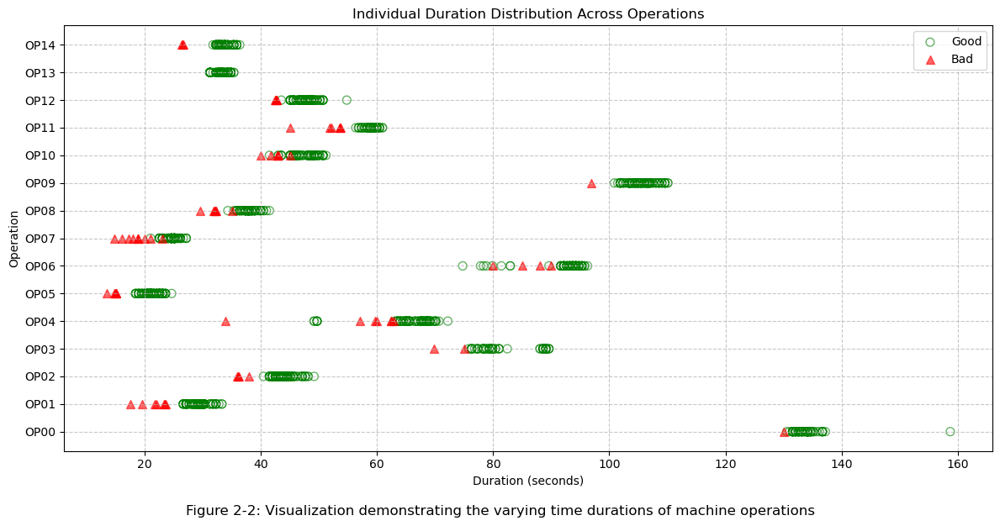


Time Range Between Different Operations (seconds):
OP00:
  Good - Min: 130.56, Max: 158.72, Avg: 133.90, Count: 83
  Bad  - Min: 130.00, Max: 130.00, Avg: 130.00, Count: 1
OP01:
  Good - Min: 26.62, Max: 33.28, Avg: 29.18, Count: 136
  Bad  - Min: 17.45, Max: 23.54, Avg: 21.55, Count: 7
OP02:
  Good - Min: 40.45, Max: 49.15, Avg: 43.90, Count: 148
  Bad  - Min: 35.86, Max: 37.87, Avg: 36.48, Count: 4
OP03:
  Good - Min: 75.78, Max: 89.60, Avg: 81.99, Count: 68
  Bad  - Min: 69.83, Max: 75.00, Avg: 72.41, Count: 2
OP04:
  Good - Min: 49.15, Max: 72.19, Avg: 65.92, Count: 105
  Bad  - Min: 33.87, Max: 62.88, Avg: 56.87, Count: 7
OP05:
  Good - Min: 18.43, Max: 24.62, Avg: 21.25, Count: 114
  Bad  - Min: 13.40, Max: 15.10, Avg: 14.71, Count: 6
OP06:
  Good - Min: 74.75, Max: 96.26, Avg: 92.24, Count: 84
  Bad  - Min: 80.00, Max: 90.00, Avg: 85.77, Count: 4
OP07:
  Good - Min: 20.99, Max: 27.14, Avg: 24.75, Count: 148
  Bad  - Min: 14.74, Max: 23.00, Avg: 18.64, Count: 10
OP08:
  Good - M

In [5]:
# New Section: Check Time Range Between Different Operations (Scatter Plot of Individual Durations)

# Sampling frequency (already defined, but included for clarity)
sampling_rate = 2000  # 2 kHz (2000 samples per second)

# Dictionary to store durations with good/bad distinction
operation_durations = {op: {'good': [], 'bad': []} for op in process_names}

# Calculate durations and group by operation and label
for i, (sample, label) in enumerate(zip(X_data, y_data)):
    # Extract operation name from the label (e.g., "M01_Aug_2019_OP00_000_good" -> "OP00")
    operation = None
    for op in process_names:
        if op in label:
            operation = op
            break
    if operation is None:
        continue  # Skip if operation not found in label

    # Determine if good or bad from label
    quality = 'good' if 'good' in label.lower() else 'bad'

    # Calculate duration in seconds
    duration = len(sample) / sampling_rate
    operation_durations[operation][quality].append(duration)

# Prepare data for plotting
plt.figure(figsize=(12, 6))

# Plot individual durations for each operation
y_positions = range(len(process_names))
for i, operation in enumerate(process_names):
    good_durations = operation_durations[operation]['good']
    bad_durations = operation_durations[operation]['bad']

    # Plot good durations as green empty circles
    if good_durations:
        plt.scatter(good_durations, [i] * len(good_durations),
                    facecolors='none', edgecolors='green', marker='o', s=50, alpha=0.6, label='Good' if i == 0 else None)

    # Plot bad durations as red triangles
    if bad_durations:
        plt.scatter(bad_durations, [i] * len(bad_durations),
                   color='red', marker='^', s=50, alpha=0.6, label='Bad' if i == 0 else None)

# Customize the plot
plt.yticks(y_positions, process_names)
plt.xlabel('Duration (seconds)')
plt.ylabel('Operation')
plt.title('Individual Duration Distribution Across Operations')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.figtext(0.5, -0.03, 'Figure 2-2: Visualization demonstrating the varying time durations of machine operations', ha='center', fontsize=12)
plt.show()

# Print summary statistics for reference
print("\nTime Range Between Different Operations (seconds):")
for operation in process_names:
    good_durs = operation_durations[operation]['good']
    bad_durs = operation_durations[operation]['bad']

    if not (good_durs or bad_durs):
        print(f"{operation}: No data available")
        continue

    print(f"{operation}:")
    if good_durs:
        print(f"  Good - Min: {min(good_durs):.2f}, Max: {max(good_durs):.2f}, Avg: {np.mean(good_durs):.2f}, Count: {len(good_durs)}")
    if bad_durs:
        print(f"  Bad  - Min: {min(bad_durs):.2f}, Max: {max(bad_durs):.2f}, Avg: {np.mean(bad_durs):.2f}, Count: {len(bad_durs)}")

The scatter plot highlights a notable outlier in OP00, with a good data point at 158 seconds, standing out against the majority of durations that cluster below 50 seconds across operations. A higher percentage of bad data points (red triangles) is evident below 50 seconds, particularly in operations like OP02, OP07, and OP08, where they densely cluster around 20–40 seconds. Smaller, transparent symbols help manage overlaps, revealing these patterns and suggesting potential inconsistencies in operations that warrant further investigation.

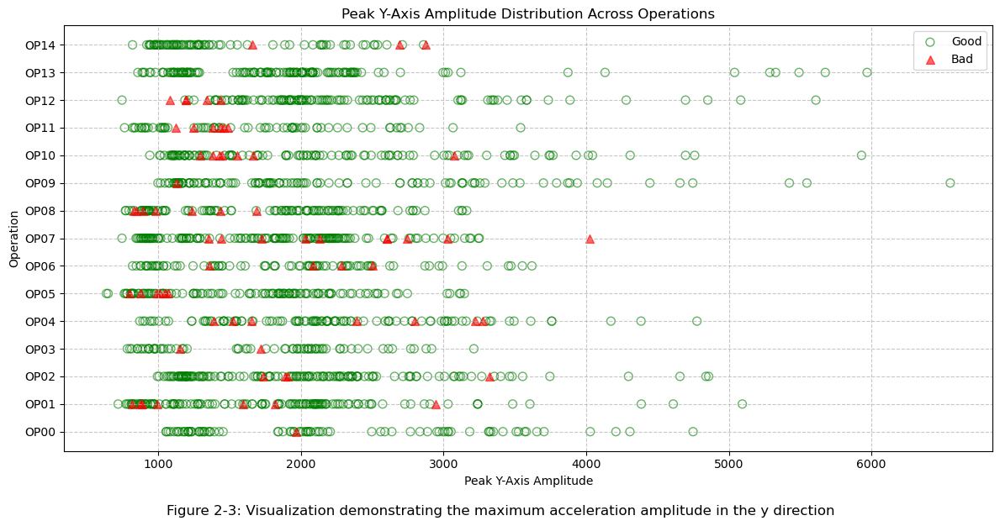


Peak Y-Axis Amplitude Across Different Operations:

Global Statistics:
  Good - Global Min: 636.00, Global Max: 6552.00
  Bad  - Global Min: 800.00, Global Max: 4026.00

Per Operation Statistics:
OP00:
  Good - Min: 1054.00, Max: 4749.00, Avg: 2185.48, Count: 83
  Bad  - Min: 1963.00, Max: 1963.00, Avg: 1963.00, Count: 1
OP01:
  Good - Min: 718.00, Max: 5094.00, Avg: 1773.55, Count: 136
  Bad  - Min: 817.00, Max: 2943.00, Avg: 1418.29, Count: 7
OP02:
  Good - Min: 993.00, Max: 4858.00, Avg: 2004.99, Count: 148
  Bad  - Min: 1735.00, Max: 3322.00, Avg: 2213.25, Count: 4
OP03:
  Good - Min: 782.00, Max: 3212.00, Avg: 1732.87, Count: 68
  Bad  - Min: 1151.00, Max: 1717.00, Avg: 1434.00, Count: 2
OP04:
  Good - Min: 870.00, Max: 4776.00, Avg: 2206.88, Count: 105
  Bad  - Min: 1385.00, Max: 3275.00, Avg: 2320.71, Count: 7
OP05:
  Good - Min: 636.00, Max: 3146.00, Avg: 1670.11, Count: 114
  Bad  - Min: 800.00, Max: 1069.00, Avg: 964.50, Count: 6
OP06:
  Good - Min: 819.00, Max: 3619.00, Avg

In [6]:
# New Section: Check Y-Axis Amplitude Across Different Operations (Scatter Plot of Peak Amplitudes)

# Dictionary to store peak Y-axis amplitudes with good/bad distinction
operation_amplitudes = {op: {'good': [], 'bad': []} for op in process_names}

# Lists to store all amplitudes for global max/min calculation
all_good_amplitudes = []
all_bad_amplitudes = []

# Calculate peak Y-axis amplitudes and group by operation and label
for i, (sample, label) in enumerate(zip(X_data, y_data)):
    # Extract operation name from the label (e.g., "M01_Aug_2019_OP00_000_good" -> "OP00")
    operation = None
    for op in process_names:
        if op in label:
            operation = op
            break
    if operation is None:
        continue  # Skip if operation not found in label

    # Determine if good or bad from label
    quality = 'good' if 'good' in label.lower() else 'bad'

    # Calculate the maximum absolute amplitude of the Y-axis (column 1)
    peak_amplitude = np.max(np.abs(sample[:, 1]))  # Y-axis is the second column (index 1)
    operation_amplitudes[operation][quality].append(peak_amplitude)

    # Store amplitudes for global max/min
    if quality == 'good':
        all_good_amplitudes.append(peak_amplitude)
    else:
        all_bad_amplitudes.append(peak_amplitude)

# Calculate global max and min
global_max_good = max(all_good_amplitudes) if all_good_amplitudes else None
global_min_good = min(all_good_amplitudes) if all_good_amplitudes else None
global_max_bad = max(all_bad_amplitudes) if all_bad_amplitudes else None
global_min_bad = min(all_bad_amplitudes) if all_bad_amplitudes else None

# Prepare data for plotting
plt.figure(figsize=(12, 6))

# Plot individual peak amplitudes for each operation
y_positions = range(len(process_names))
for i, operation in enumerate(process_names):
    good_amplitudes = operation_amplitudes[operation]['good']
    bad_amplitudes = operation_amplitudes[operation]['bad']

    # Plot good amplitudes as green empty circles
    if good_amplitudes:
        plt.scatter(good_amplitudes, [i] * len(good_amplitudes),
                    facecolors='none', edgecolors='green', marker='o', s=50, alpha=0.6, label='Good' if i == 0 else None)

    # Plot bad amplitudes as red triangles
    if bad_amplitudes:
        plt.scatter(bad_amplitudes, [i] * len(bad_amplitudes),
                    color='red', marker='^', s=50, alpha=0.6, label='Bad' if i == 0 else None)

# Customize the plot
plt.yticks(y_positions, process_names)
plt.xlabel('Peak Y-Axis Amplitude')
plt.ylabel('Operation')
plt.title('Peak Y-Axis Amplitude Distribution Across Operations')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.figtext(0.5, -0.03, 'Figure 2-3: Visualization demonstrating the maximum acceleration amplitude in the y direction', ha='center', fontsize=12)
plt.show()

# Print summary statistics for reference, including global max/min
print("\nPeak Y-Axis Amplitude Across Different Operations:")
print("\nGlobal Statistics:")
if all_good_amplitudes:
    print(f"  Good - Global Min: {global_min_good:.2f}, Global Max: {global_max_good:.2f}")
if all_bad_amplitudes:
    print(f"  Bad  - Global Min: {global_min_bad:.2f}, Global Max: {global_max_bad:.2f}")

print("\nPer Operation Statistics:")
for operation in process_names:
    good_amps = operation_amplitudes[operation]['good']
    bad_amps = operation_amplitudes[operation]['bad']

    if not (good_amps or bad_amps):
        print(f"{operation}: No data available")
        continue

    print(f"{operation}:")
    if good_amps:
        print(f"  Good - Min: {min(good_amps):.2f}, Max: {max(good_amps):.2f}, Avg: {np.mean(good_amps):.2f}, Count: {len(good_amps)}")
    if bad_amps:
        print(f"  Bad  - Min: {min(bad_amps):.2f}, Max: {max(bad_amps):.2f}, Avg: {np.mean(bad_amps):.2f}, Count: {len(bad_amps)}")

The scatter plot reveals a broad range of peak Y-axis amplitudes, from 636 to 6552, with bad samples (red triangles) frequently showing higher amplitudes, especially in operations like OP04 and OP07. Applying a logarithmic transformation compresses this range, aiming to make differences between good and bad samples more discernible, but no distinct patterns emerge to clearly differentiate them across operations. This suggests that further normalization or alternative preprocessing methods may be needed to better identify consistent features for distinguishing good and bad samples.

## 2.4 Plot sample acceleration data


Total number of 'good' files: 1632
Total number of 'bad' files: 70
Total number of files: 1702
Plotting Good Sample 1 (Shape: (268288, 3)) - Label: M01_Aug_2019_OP00_000_good
Plotting Good Sample 2 (Shape: (49152, 3)) - Label: M02_Feb_2020_OP07_002_good
Plotting Good Sample 3 (Shape: (65536, 3)) - Label: M02_Feb_2021_OP14_014_good
Plotting Bad Sample 1 (Shape: (260000, 3)) - Label: M02_Feb_2021_OP00_000_bad
Plotting Bad Sample 2 (Shape: (34447, 3)) - Label: M02_Aug_2019_OP07_000_bad
Plotting Bad Sample 3 (Shape: (53041, 3)) - Label: M02_Feb_2019_OP14_001_bad


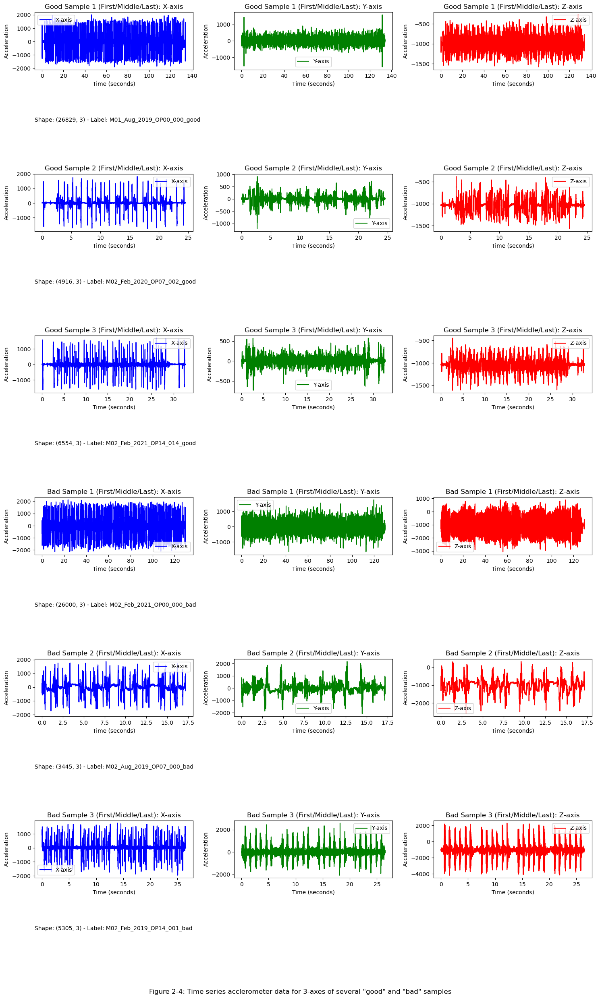

In [7]:
# Assuming X_data and y_data are already loaded from Part 1

# Part 2a: Calculate the number of "good" and "bad" files
good_indices = [i for i, label in enumerate(y_data) if label.endswith("_good")]
bad_indices = [i for i, label in enumerate(y_data) if label.endswith("_bad")]

good_file_count = len(good_indices)
bad_file_count = len(bad_indices)

print(f"\nTotal number of 'good' files: {good_file_count}")
print(f"Total number of 'bad' files: {bad_file_count}")
print(f"Total number of files: {good_file_count + bad_file_count}")

# Part 2b: Plot first, middle, and last "good" and "bad" files with x-axis in seconds

# Select first, middle, and last "good" and "bad" samples
good_X_data = [X_data[i] for i in good_indices]
bad_X_data = [X_data[i] for i in bad_indices]

# Calculate indices for first, middle, last
num_good = len(good_X_data)
num_bad = len(bad_X_data)

good_selected_indices = [
    0,  # First
    num_good // 2,  # Middle
    num_good - 1  # Last
]
bad_selected_indices = [
    0,  # First
    num_bad // 2,  # Middle
    num_bad - 1  # Last
]

good_samples = [good_X_data[i] for i in good_selected_indices]
good_labels = [y_data[good_indices[i]] for i in good_selected_indices]
bad_samples = [bad_X_data[i] for i in bad_selected_indices]
bad_labels = [y_data[bad_indices[i]] for i in bad_selected_indices]

# Sampling frequency
sampling_rate = 2000  # 2 kHz (2000 samples per second)

# Plotting: 3 good + 3 bad = 6 samples, 2 rows per sample (1 for plot, 1 for text)
total_samples = 3 * 2  # 3 good + 3 bad
fig, axes = plt.subplots(2 * total_samples, 3, figsize=(15, 4 * total_samples))

# Plot "good" samples
for i, (sample, label) in enumerate(zip(good_samples, good_labels)):
    print(f"Plotting Good Sample {i+1} (Shape: {sample.shape}) - Label: {label}")
    # Downsample for plotting if too large
    downsample_factor = 10
    if len(sample) > 10000:
        sample = sample[::downsample_factor, :]  # Take every 10th sample to reduce density

    # Create time array in seconds
    n_samples = len(sample)
    time_seconds = np.arange(n_samples) * (downsample_factor / sampling_rate)

    # X-axis
    axes[i*2, 0].plot(time_seconds, sample[:, 0], label='X-axis', color='blue')
    axes[i*2, 0].set_title(f"Good Sample {i+1} (First/Middle/Last): X-axis")
    axes[i*2, 0].set_ylabel('Acceleration')
    axes[i*2, 0].set_xlabel('Time (seconds)')
    axes[i*2, 0].legend()
    # Y-axis
    axes[i*2, 1].plot(time_seconds, sample[:, 1], label='Y-axis', color='green')
    axes[i*2, 1].set_title(f"Good Sample {i+1} (First/Middle/Last): Y-axis")
    axes[i*2, 1].set_ylabel('Acceleration')
    axes[i*2, 1].set_xlabel('Time (seconds)')
    axes[i*2, 1].legend()
    # Z-axis
    axes[i*2, 2].plot(time_seconds, sample[:, 2], label='Z-axis', color='red')
    axes[i*2, 2].set_title(f"Good Sample {i+1} (First/Middle/Last): Z-axis")
    axes[i*2, 2].set_ylabel('Acceleration')
    axes[i*2, 2].set_xlabel('Time (seconds)')
    axes[i*2, 2].legend()

    # Add shape and label info below the plot
    axes[i*2+1, 0].text(0, 0.5, f"Shape: {sample.shape} - Label: {label}", fontsize=10)
    axes[i*2+1, 0].axis('off')
    axes[i*2+1, 1].axis('off')
    axes[i*2+1, 2].axis('off')
plt.figtext(0.5, -0.03, 'Figure 2-4: Time series acclerometer data for 3-axes of several "good" and "bad" samples', ha='center', fontsize=12)
# Plot "bad" samples
for i, (sample, label) in enumerate(zip(bad_samples, bad_labels)):
    print(f"Plotting Bad Sample {i+1} (Shape: {sample.shape}) - Label: {label}")
    row = (3 * 2) + i*2  # Offset for bad samples (starts at row 6)
    # Downsample for plotting if too large
    downsample_factor = 10
    if len(sample) > 10000:
        sample = sample[::downsample_factor, :]  # Take every 10th sample to reduce density

    # Create time array in seconds
    n_samples = len(sample)
    time_seconds = np.arange(n_samples) * (downsample_factor / sampling_rate)

    # X-axis
    axes[row, 0].plot(time_seconds, sample[:, 0], label='X-axis', color='blue')
    axes[row, 0].set_title(f"Bad Sample {i+1} (First/Middle/Last): X-axis")
    axes[row, 0].set_ylabel('Acceleration')
    axes[row, 0].set_xlabel('Time (seconds)')
    axes[row, 0].legend()
    # Y-axis
    axes[row, 1].plot(time_seconds, sample[:, 1], label='Y-axis', color='green')
    axes[row, 1].set_title(f"Bad Sample {i+1} (First/Middle/Last): Y-axis")
    axes[row, 1].set_ylabel('Acceleration')
    axes[row, 1].set_xlabel('Time (seconds)')
    axes[row, 1].legend()
    # Z-axis
    axes[row, 2].plot(time_seconds, sample[:, 2], label='Z-axis', color='red')
    axes[row, 2].set_title(f"Bad Sample {i+1} (First/Middle/Last): Z-axis")
    axes[row, 2].set_ylabel('Acceleration')
    axes[row, 2].set_xlabel('Time (seconds)')
    axes[row, 2].legend()

    # Add shape and label info below the plot
    axes[row+1, 0].text(0, 0.5, f"Shape: {sample.shape} - Label: {label}", fontsize=10)
    axes[row+1, 0].axis('off')
    axes[row+1, 1].axis('off')
    axes[row+1, 2].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

Plotting good and bad samples side by side in operation sequence reveals both differences and similarities, with bad samples often showing longer durations and more erratic acceleration patterns across X, Y, and Z axes. However, it remains difficult to confirm if these patterns are a reliable indicator or feature for distinguishing good versus bad samples across all operations. Additional analysis is needed to determine if extended durations and higher acceleration spikes consistently correlate with poor performance across various operations.

# 3. Pre-Processing

## 3.1 Transform data to frequency domain

Plotting Good Data


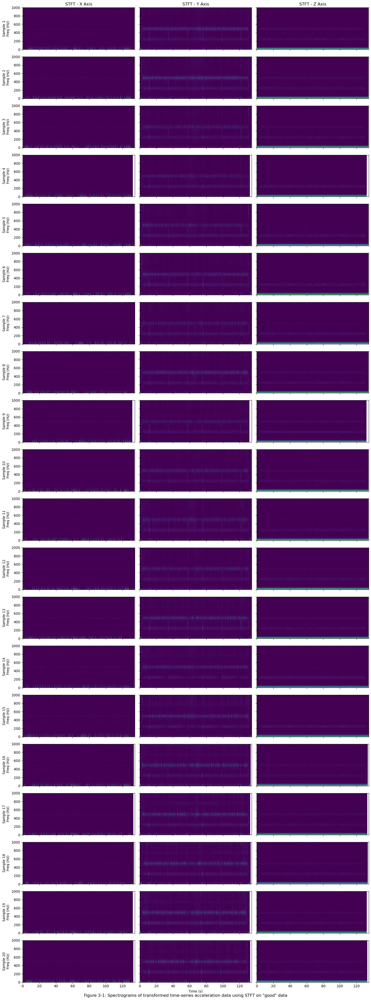

Plotting bad sample data


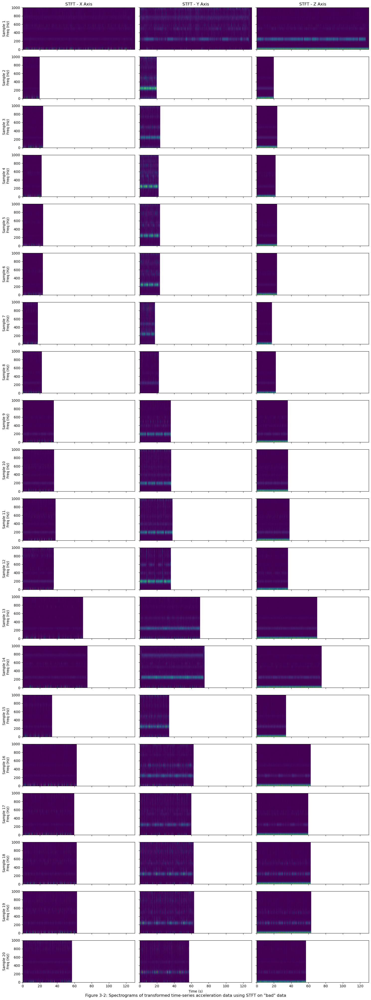

In [8]:
def plot_stft(data, figure='Figure x.x', good_bad='"good"'):

    fs = 2000
    window_size = 64
    noverlap = window_size // 2 # Overlapping for smoother view


    num_samples = 20  # Number of samples to repeat the plots

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 40), sharex=True, sharey=True)

    for sample_idx in range(num_samples):
        data_sample = data[sample_idx].T  # Transpose for X, Y, Z

        for i, (axis, label) in enumerate(zip(data_sample, ['X', 'Y', 'Z'])):
            f, t, Zxx = stft(axis, fs=fs, nperseg=window_size, noverlap=noverlap)

            # Plot Spectrogram
            ax = axes[sample_idx, i]
            ax.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
            ax.set_ylim(0, 1000)  # Limit to relevant frequencies

            if sample_idx == 0:  # Set titles only for the first row
                ax.set_title(f'STFT - {label} Axis')

            if i == 0:  # Set Y-label only for the first column
                ax.set_ylabel(f'Sample {sample_idx + 1}\nFreq (Hz)')

    axes[-1, 1].set_xlabel('Time (s)')  # Set x-label only at the bottom center

    plt.figtext(0.5, 0.00, f'{figure}: Spectrograms of transformed time-series acceleration data using STFT on {good_bad} data', ha='center', fontsize=12)
    plt.tight_layout()
    plt.show()




print ("Plotting Good Data")
plot_stft(good_X_data, 'Figure 3-1', '"good"')


print("Plotting bad sample data")
plot_stft(bad_X_data, 'Figure 3-2', '"bad"')



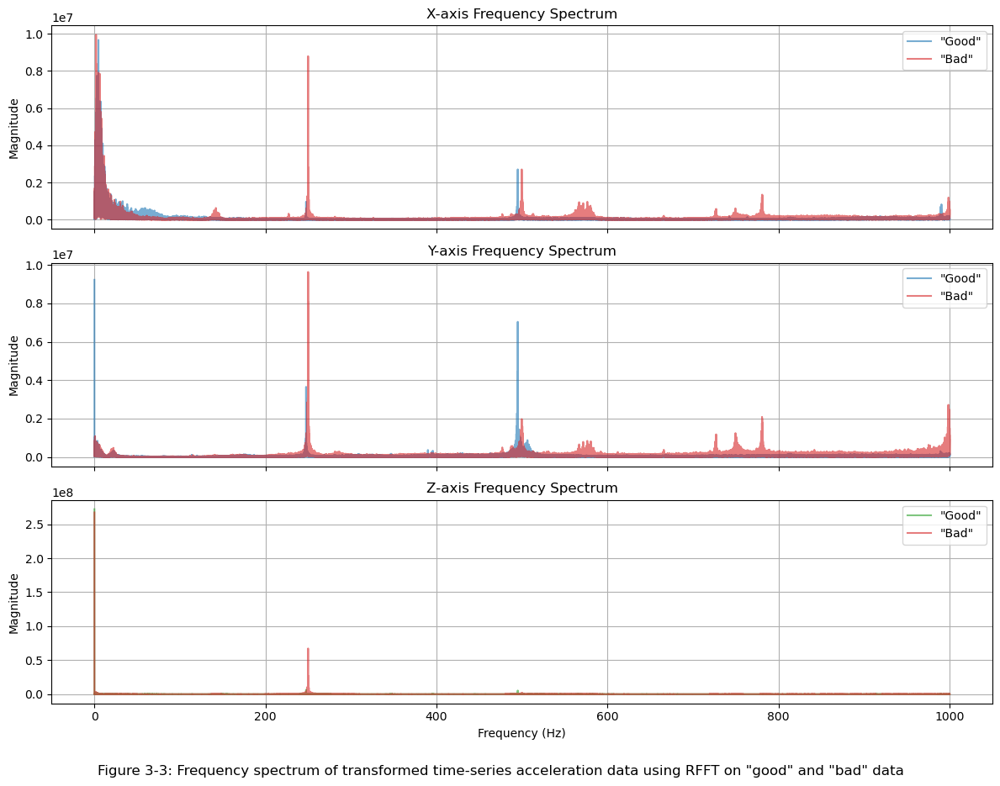

In [9]:
def rfft_transformation(data):

    fs=2000

    sample_sensor_data = data[0]

    x = sample_sensor_data[:, 0]
    y = sample_sensor_data[:, 1]
    z = sample_sensor_data[:, 2]

    freqs = rfftfreq(len(x), d=1/fs)
    x_fft = np.abs(rfft(x))
    y_fft = np.abs(rfft(y))
    z_fft = np.abs(rfft(z))

    return x_fft, y_fft, z_fft, freqs

good_x_fft, good_y_fft, good_z_fft, good_freqs  = rfft_transformation(good_X_data)
bad_x_fft, bad_y_fft, bad_z_fft, bad_freqs = rfft_transformation(bad_X_data)


fig, axs = plt.subplots(3, 1, figsize=(12, 9), sharex=True)


axs[0].plot(good_freqs, good_x_fft, color='tab:blue', alpha=0.6, label='"Good"')
axs[0].plot(bad_freqs, bad_x_fft, color='tab:red', alpha=0.6, label='"Bad"')

axs[0].set_title('X-axis Frequency Spectrum')
axs[0].set_ylabel('Magnitude')
axs[0].grid(True)
axs[0].legend()

axs[1].plot(good_freqs, good_y_fft, color='tab:blue', alpha=0.6, label='"Good"')
axs[1].plot(bad_freqs, bad_y_fft, color='tab:red', alpha=0.6, label='"Bad"')
axs[1].set_title('Y-axis Frequency Spectrum')
axs[1].set_ylabel('Magnitude')
axs[1].grid(True)
axs[1].legend()

axs[2].plot(good_freqs, good_z_fft, color='tab:green', alpha=0.6, label='"Good"')
axs[2].plot(bad_freqs, bad_z_fft, color='tab:red', alpha=0.6, label='"Bad"')
axs[2].set_title('Z-axis Frequency Spectrum')
axs[2].set_xlabel('Frequency (Hz)')
axs[2].set_ylabel('Magnitude')
axs[2].grid(True)
axs[2].legend()

plt.figtext(0.5, -0.03, 'Figure 3-3: Frequency spectrum of transformed time-series acceleration data using RFFT on "good" and "bad" data', ha='center', fontsize=12)
plt.tight_layout()
plt.show()

Looking at the magnitude of the different frequencies, it appears that certain frequencies have much higher magnitude in bad samples. This is clear when reviewing the STFT, which is plotting the frequencies over time, that certain frequencies for the bad samples are more prominent. Looking at the RFFT charts, which distills the signal into its core frequencies, that the magnitude of frequencies like 230 is typically higher in bad samples. THis could be very helpful for helping the model identify issues in the opperation

# 3.2 Chunking Data

One approach to solving the issue of varying operation durations is to chunk the data into fixed windows of time.

In [10]:
def chunk_time_series(X_data, y_data):
    """
    Process time series data with memory efficiency by:
    1. Calculating the most common length (with tie-breaker)
    2. Processing each series individually
    3. Using numpy views instead of copies where possible
    """
    # Find chunk size using smallest mode of lengths
    lengths = [len(ts) for ts in X_data]
    counts = Counter(lengths)
    max_count = max(counts.values(), default=0)
    mode_candidates = [l for l, cnt in counts.items() if cnt == max_count]
    chunk_size = min(mode_candidates) if mode_candidates else 0

    # Pre-allocate lists to store results (avoids incremental resizing)
    chunked_data = []
    chunked_labels = []

    for ts, lbl in zip(X_data, y_data):
        ts_len = ts.shape[0]  # Use shape[0] for 2D array length

        # Process based on length comparison to chunk_size
        if ts_len < chunk_size:
            # Symmetric padding with minimal memory
            pad_total = chunk_size - ts_len
            pad_left = pad_total // 2
            pad_right = pad_total - pad_left

            # Create padded array with optimized numpy operations
            padded = np.zeros((chunk_size, ts.shape[1]), dtype=ts.dtype)
            padded[pad_left:pad_left+ts_len] = ts
            chunked_data.append(padded)
            chunked_labels.append(lbl)

        elif ts_len == chunk_size:
            # Use original array view (no copy)
            chunked_data.append(ts)
            chunked_labels.append(lbl)

        else:
            # Generate overlapping chunks without full copy
            num_chunks = int(np.ceil(ts_len / chunk_size))
            starts = np.linspace(0, ts_len - chunk_size, num=num_chunks, dtype=int)

            # Create memory-efficient views
            for start in starts:
                chunk = ts[start:start+chunk_size]
                chunked_data.append(chunk)
                chunked_labels.append(lbl)

    return chunked_data, chunked_labels

In [11]:
chunked_data, chunked_labels = chunk_time_series(X_data,y_data)

In [12]:
len(chunked_data), len(chunked_labels)

(3582, 3582)


Duration Range for Good Data (seconds):
  Minimum: 32.77 seconds
  Maximum: 32.77 seconds
  Average: 32.77 seconds

Duration Range for Bad Data (seconds):
  Minimum: 32.77 seconds
  Maximum: 32.77 seconds
  Average: 32.77 seconds


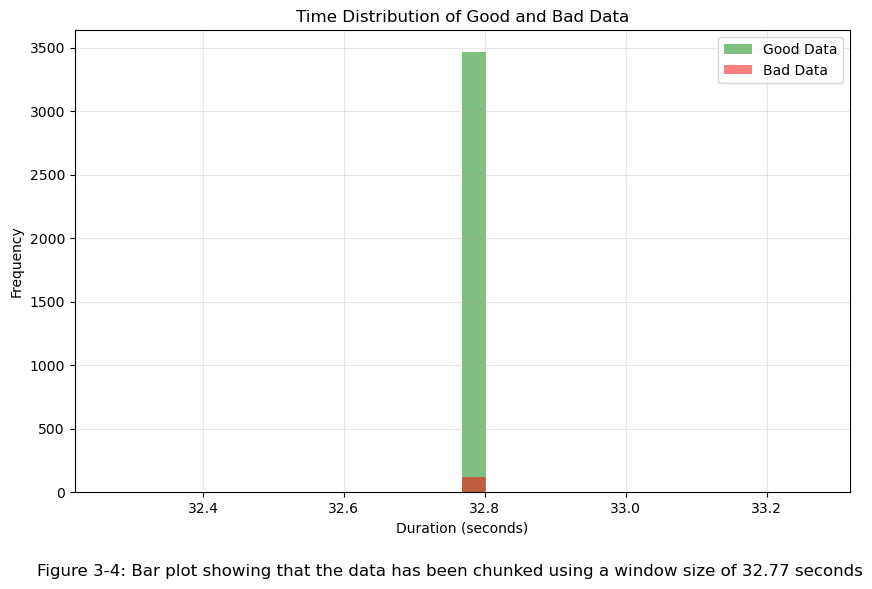

In [13]:
sampling_rate = 2000  # 2 kHz (2000 samples per second)

# Separate good and bad data
good_indices = [i for i, label in enumerate(chunked_labels) if label.endswith("_good")]
bad_indices = [i for i, label in enumerate(chunked_labels) if label.endswith("_bad")]

good_X_data = [chunked_data[i] for i in good_indices]
bad_X_data = [chunked_data[i] for i in bad_indices]

# Calculate durations in seconds
good_durations = [len(sample) / sampling_rate for sample in good_X_data]
bad_durations = [len(sample) / sampling_rate for sample in bad_X_data]

# Compute min, max, and average durations
good_min_duration = min(good_durations) if good_durations else 0
good_max_duration = max(good_durations) if good_durations else 0
good_avg_duration = np.mean(good_durations) if good_durations else 0

bad_min_duration = min(bad_durations) if bad_durations else 0
bad_max_duration = max(bad_durations) if bad_durations else 0
bad_avg_duration = np.mean(bad_durations) if bad_durations else 0

# Print the results
print("\nDuration Range for Good Data (seconds):")
print(f"  Minimum: {good_min_duration:.2f} seconds")
print(f"  Maximum: {good_max_duration:.2f} seconds")
print(f"  Average: {good_avg_duration:.2f} seconds")

print("\nDuration Range for Bad Data (seconds):")
print(f"  Minimum: {bad_min_duration:.2f} seconds")
print(f"  Maximum: {bad_max_duration:.2f} seconds")
print(f"  Average: {bad_avg_duration:.2f} seconds")

# Plot the time distribution
plt.figure(figsize=(10, 6))
plt.hist(good_durations, bins=30, alpha=0.5, label='Good Data', color='green')
plt.hist(bad_durations, bins=30, alpha=0.5, label='Bad Data', color='red')
plt.title('Time Distribution of Good and Bad Data')
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)
plt.figtext(0.5, -0.03, 'Figure 3-4: Bar plot showing that the data has been chunked using a window size of 32.77 seconds', ha='center', fontsize=12)
plt.show()

In [14]:
len(good_indices), len(bad_indices)

(3465, 117)

# 4. Baseline Model

In [15]:
# 🔧 Parameters
machines = ["M01", "M02", "M03"]
process_names = [f"OP{i:02d}" for i in range(15)]
labels = ["good", "bad"]
sampling_rate = 2000  # Hz
path_to_dataset = Path('content/data').absolute()

In [16]:
# 📂 Load Function
def find_all_h5s_in_dir(s_dir):
    fileslist = []
    for root, _, files in os.walk(s_dir):
        for file in files:
            if file.endswith(".h5"):
                fileslist.append(os.path.join(root, file))
    return fileslist

In [17]:
# 📥 Load Raw Data
X_data = []
y_data = []
file_paths = []

for process_name, machine, label in itertools.product(process_names, machines, labels):
    data_path = path_to_dataset / machine / process_name / label
    if not data_path.exists():
        continue

    h5_files = find_all_h5s_in_dir(data_path)
    for file in h5_files:
        with h5py.File(file, 'r') as f:
            vibration_data = f['vibration_data'][:]
        X_data.append(vibration_data)
        y_data.append(label)
        file_paths.append(file)

print(f"Loaded {len(X_data)} samples with {len(y_data)} labels.")

Loaded 1702 samples with 1702 labels.


In [18]:
# 🔍 Heuristic Filter Function
def apply_heuristic_filter(vibration_data, amp_thresh=4750, dur_thresh=19.0, sampling_rate=2000):
    duration = len(vibration_data) / sampling_rate
    peak_y = np.max(np.abs(vibration_data[:, 1]))
    return 1 if (peak_y > amp_thresh) or (duration < dur_thresh) else 0

In [19]:
# 🧪 Convert Labels and Apply Heuristic Filter
# Convert string labels ("good", "bad") to numerical labels (0, 1)
true_labels = [0 if label == "good" else 1 for label in y_data]

# Apply heuristic filter to all samples
heuristic_preds = [apply_heuristic_filter(x) for x in X_data]

In [20]:
# 📊 Classification Metrics
# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, heuristic_preds, labels=[0, 1])

# Display confusion matrix
print("=== Confusion Matrix ===")
print("Rows = Actual Labels, Columns = Predicted Labels")
print("       Predicted Good | Predicted Bad")
print(f"Actual Good     {conf_matrix[0, 0]:>5}          {conf_matrix[0, 1]:>5}")
print(f"Actual Bad      {conf_matrix[1, 0]:>5}          {conf_matrix[1, 1]:>5}")

# Display classification report
print("\n=== Classification Report ===")
print("This report summarizes the classification performance for each class:")
print(classification_report(true_labels, heuristic_preds,
                          labels=[0, 1],
                          target_names=["Good", "Bad"],
                          zero_division=0))

=== Confusion Matrix ===
Rows = Actual Labels, Columns = Predicted Labels
       Predicted Good | Predicted Bad
Actual Good      1604             28
Actual Bad         56             14

=== Classification Report ===
This report summarizes the classification performance for each class:
              precision    recall  f1-score   support

        Good       0.97      0.98      0.97      1632
         Bad       0.33      0.20      0.25        70

    accuracy                           0.95      1702
   macro avg       0.65      0.59      0.61      1702
weighted avg       0.94      0.95      0.94      1702



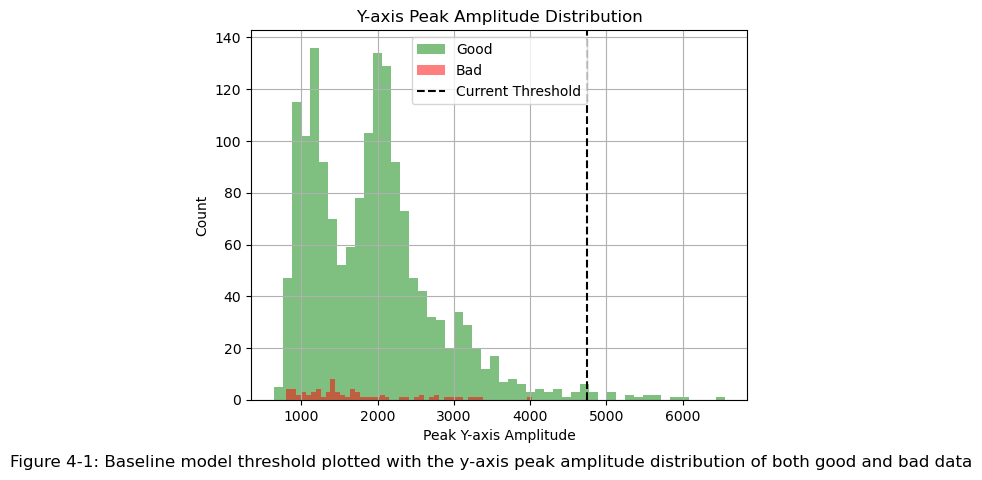

In [21]:
# 📈 Visualize Peak Y Amplitudes
good_peaks = [np.max(np.abs(x[:, 1])) for i, x in enumerate(X_data) if y_data[i] == "good"]
bad_peaks = [np.max(np.abs(x[:, 1])) for i, x in enumerate(X_data) if y_data[i] == "bad"]

plt.hist(good_peaks, bins=50, alpha=0.5, label='Good', color='green')
plt.hist(bad_peaks, bins=50, alpha=0.5, label='Bad', color='red')
plt.axvline(4750, color='black', linestyle='--', label='Current Threshold')
plt.xlabel("Peak Y-axis Amplitude")
plt.ylabel("Count")
plt.title("Y-axis Peak Amplitude Distribution")
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure 4-1: Baseline model threshold plotted with the y-axis peak amplitude distribution of both good and bad data', ha='center', fontsize=12)
plt.show()

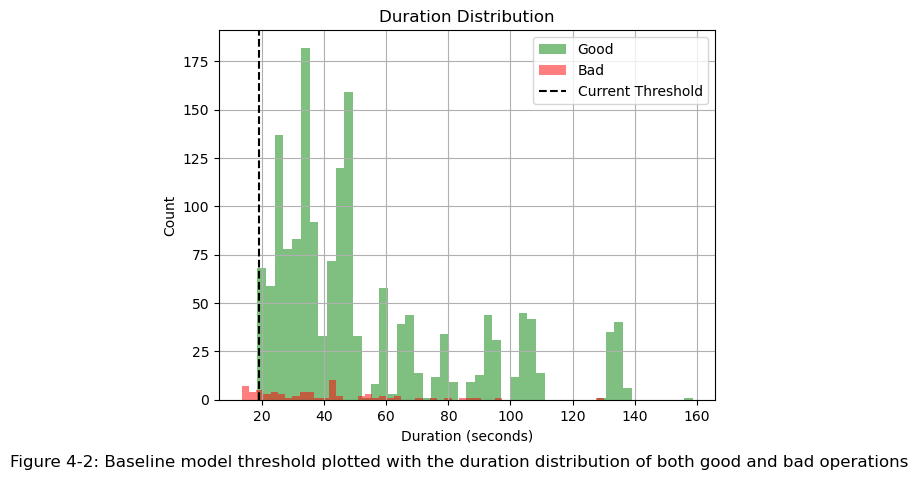

In [22]:
# 📈 Visualize Durations
good_durations = [len(x) / sampling_rate for i, x in enumerate(X_data) if y_data[i] == "good"]
bad_durations = [len(x) / sampling_rate for i, x in enumerate(X_data) if y_data[i] == "bad"]

plt.hist(good_durations, bins=50, alpha=0.5, label='Good', color='green')
plt.hist(bad_durations, bins=50, alpha=0.5, label='Bad', color='red')
plt.axvline(19.0, color='black', linestyle='--', label='Current Threshold')
plt.xlabel("Duration (seconds)")
plt.ylabel("Count")
plt.title("Duration Distribution")
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure 4-2: Baseline model threshold plotted with the duration distribution of both good and bad operations', ha='center', fontsize=12)
plt.show()

In [23]:
# 🔧 Threshold Optimization
best_f1 = 0
best_config = None

for amp_thresh in range(3000, 5000, 250):
    for dur_thresh in range(15, 35, 2):
        preds = [apply_heuristic_filter(x, amp_thresh, dur_thresh) for x in X_data]
        f1 = f1_score(true_labels, preds)
        if f1 > best_f1:
            best_f1 = f1
            best_config = (amp_thresh, dur_thresh)

print(f"Best F1 for 'bad': {best_f1:.4f} at thresholds: amp={best_config[0]}, dur={best_config[1]}")

Best F1 for 'bad': 0.2500 at thresholds: amp=4750, dur=19


# 5. Data Pipeline

## 5.1 Supporting Functions

In [2]:
# 📂 Load Data
def load_clean_dataset():
    def find_all_h5s_in_dir(s_dir):
        fileslist = []
        for root, _, files in os.walk(s_dir):
            for file in files:
                if file.endswith(".h5"):
                    fileslist.append(os.path.join(root, file))
        return fileslist


    X_data = []
    y_data = []
    file_paths = []

    machines = ["M01", "M02", "M03"]
    process_names = [f"OP{i:02d}" for i in range(15)]
    labels = ["good", "bad"]
    sampling_rate = 2000  # Hz
    # path_to_dataset = Path("/content/data").absolute()
    path_to_dataset = Path("content/data").absolute()

    for process_name, machine, label in itertools.product(process_names, machines, labels):
        data_path = path_to_dataset / machine / process_name / label
        # print(data_path)
        if not data_path.exists():
            continue

        h5_files = find_all_h5s_in_dir(data_path)
        for file in h5_files:
            with h5py.File(file, 'r') as f:
                vibration_data = f['vibration_data'][:]
            X_data.append(vibration_data)
            y_data.append(label)
            file_paths.append(file)

    print(f"Loaded {len(X_data)} samples with {len(y_data)} labels.")
    return X_data, y_data




In [3]:
def seperate_test_set(X_data, y_data):
    '''
        Breaks out the full operations without any chunking or preprocessing
    '''

    X, X_test, y, y_test = train_test_split(X_data, y_data, test_size=0.1, stratify=y_data)

    print(f'Number of test bad full opperations: {y_test.count("bad")}')
    print(f'Number of training and val bad full opperations: {y.count("bad")}')

    return X, X_test, y, y_test

In [4]:
def break_data_to_windows(X_data, y_data, window_size):

    def chunk_it(data,chunk_size):

        chunks = []
        for sample in data:
            # Trim to nearest multiple of the window size
            n_full_chunks = sample.shape[0] // chunk_size
            trimmed = sample[:n_full_chunks * chunk_size, :]
            trimmed = trimmed.reshape(n_full_chunks, chunk_size, 3)
            chunks.extend(trimmed)

        return np.array(chunks)

    good_x_data = [x for x,y in zip(X_data, y_data) if y == "good"]
    bad_x_data = [x for x,y in zip(X_data, y_data) if y == "bad"]

    good_chunks = chunk_it(good_x_data, chunk_size = window_size)
    bad_chunks = chunk_it(bad_x_data, chunk_size = window_size)

    y_good = np.zeros(len(good_chunks), dtype=int)
    y_bad = np.ones(len(bad_chunks), dtype=int)

    X_chunks = np.array(np.concatenate([good_chunks, bad_chunks], axis=0))
    y_chunks = np.array(np.concatenate([y_good, y_bad], axis=0))

    print(f"Shape of:\nGood chunks:{good_chunks.shape} , bad chunks {bad_chunks.shape} train/val chunks {X_chunks.shape})")

    return X_chunks, y_chunks

In [5]:
def extract_fft_features(chunks):
    fft_features = []
    for chunk in chunks:
        # rfft returns real-valued FFT (half-spectrum)
        fft_x = np.abs(rfft(chunk[:, 0]))
        fft_y = np.abs(rfft(chunk[:, 1]))
        fft_z = np.abs(rfft(chunk[:, 2]))

        # Concatenate features from x, y, z axes
        features = np.concatenate([fft_x, fft_y, fft_z])
        fft_features.append(features)

    fft_features = np.array(fft_features)
    print(f"X Type: {type(fft_features)} and shape {fft_features.shape}")

    return fft_features

In [6]:
def apply_scaling(X):
    print(X.shape)
    scaler = StandardScaler()
    if len(X.shape) == 3: # when scaling, scale each acceleration axis separetly
        n_samples, timesteps, n_features = X.shape
        X_2d = X.reshape(-1, n_features)
        X_scaled_2d = scaler.fit_transform(X_2d)
        X_scaled = X_scaled_2d.reshape(n_samples, timesteps, n_features)
    else:
        X_scaled = scaler.fit_transform(X)

    print(f"X Type: {type(X_scaled)} and shape {X_scaled.shape}")
    return X_scaled, scaler

In [7]:
def apply_PCA(X_scaled):
    pca = PCA(n_components=25)
    X_pca = pca.fit_transform(X_scaled)

    print(f"X Type: {type(X_pca)} and shape {X_pca.shape}")
    return X_pca, pca

In [8]:
def split_val(X_fft_chunks, y_chunks):
    X_train, X_val, y_train, y_val = train_test_split(X_fft_chunks, y_chunks, test_size=0.2, stratify=y_chunks)

    print(f"X Type: {type(X_train)} and shape {X_train.shape}")
    return X_train, X_val, y_train, y_val

In [9]:
def apply_SMOT(X_train, y_train):
    '''
        SMOT applies only on training, not validation or test sets

    '''
    smote = SMOTE(random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

    X_resampled = np.array(X_resampled).astype(np.float32)
    y_resampled = np.array(y_resampled).astype(np.int32)

    print("Original class distribution:", Counter(y_train))
    print("After SMOTE:", Counter(y_resampled))

    print(f"X Type: {type(X_resampled)} and shape {X_resampled.shape}")

    return X_resampled, y_resampled

In [10]:
def balance_with_weights(y):
    class_weights = dict(zip([0, 1], compute_class_weight(class_weight='balanced', classes=np.array([0, 1]), y=y)))
    return class_weights

In [11]:
def convert_to_tensor(X_train, y_train,X_val, y_val, batch):
    train_dataset = Dataset.from_tensor_slices((X_train, y_train)).shuffle(1000).batch(batch).prefetch(tf.data.AUTOTUNE)
    val_dataset = Dataset.from_tensor_slices((X_val, y_val)).batch(batch).prefetch(tf.data.AUTOTUNE)

    return train_dataset, val_dataset

In [12]:
def generate_new_datasets(batch, chunks, apply_rfft, feature_reduction, balance_using_SMOT, good_only):
    scaler = None
    pca = None
    X_val_bad = None
    X_val = None

    print("Collecting fresh data set")
    X_data, y_data = load_clean_dataset()
    X, X_test, y, y_test = seperate_test_set(X_data, y_data)

    if chunks:
        window_size=2048
        print(f"\nBraking up dataset to chunks base on a window size of {window_size}")
        X, y = break_data_to_windows(X,y, window_size = window_size)

    if apply_rfft:
        print("\nExtracting RFFT features")
        X = extract_fft_features(X)


    print("\nApplying Standard Scaling")
    X, scaler = apply_scaling(X)

    if feature_reduction:
        print("\nApplying PCA")
        X, pca = apply_PCA(X)

    print("\nSplitting to training and validation with a 90/10 split")
    X_train, X_val, y_train, y_val = split_val(X, y)

    if balance_using_SMOT:
        print("\nApplying SMOT")
        X_train, y_train = apply_SMOT(X_train, y_train)

    if good_only:
        print("Seperating good samples from bad samples for Autoencoder training")
        X_val_bad = np.concatenate([X_train[y_train==1], X_val[y_val == 1]], axis=0)
        X_train = X_train[y_train==0]
        X_val = X_val[y_val==0]
        train_dataset, val_dataset = convert_to_tensor(X_train, X_train, X_val, X_val, batch=batch)
    else:
        train_dataset, val_dataset = convert_to_tensor(X_train, y_train, X_val, y_val, batch=batch)

    print("\n\nCalculating Class Weights")
    class_weights = balance_with_weights(y_train)

    training_shape = X_train.shape
    print(f"\nDataset ready for training with number of features of {training_shape}")

    metrics=['accuracy',
             Precision(name='precision'),
             Recall(name='recall'),
             AUC(name='auc')
              ]

    return {"train_dataset": train_dataset,
            "val_dataset": val_dataset,
            "training_shape": training_shape,
            "scaler": scaler,
            "pca": pca,
            "X_val_good": X_val,
            "X_val_bad": X_val_bad,
           "class_weights":class_weights,
           "metrics":metrics, #Needed for identifying loss cuttoff of autoencoders
           "X_test": X_test,
           "y_test": y_test}   


In [13]:
def train_load_model(model_name, train_model, dataset ):
    if os.path.exists(f"models/{model_name}.keras"):
        model = load_model(f"models/{model_name}.keras")
        with open(f"history/{model_name}.pkl", 'rb') as f:
            history = pickle.load(f)
    else:
        model, history = train_model(dataset)
        model.save(f"models/{model_name}.keras")
        with open(f"history/{model_name}.pkl", 'wb') as f:
            pickle.dump(history, f)

    return model, history

## 5.2 Model Evaluation Functions

In [14]:
def plot_training(history, metric, figure1='', figure2=''):

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.figtext(0.5, -0.03, f'{figure1}', ha='center', fontsize=12)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history[metric], label=f'Train {metric}')
    plt.plot(history.history[f'val_{metric}'], label=f'Validation {metric}')
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()
    plt.title(f'Training and Validation {metric}')
    plt.figtext(0.5, -0.03, f'{figure2}', ha='center', fontsize=12)
    plt.show()

In [15]:
def save_model_metrics(model_name, accuracy, precision, recall, f1, auc, filepath='results.csv'):

    new_data = pd.DataFrame([{
        'model_name': model_name,
        'accuracy': round(accuracy,4),
        'precision': round(precision,4),
        'recall': round(recall,4),
        'f1_score': round(f1,4),
        'auc': round(auc,4),
        'Comment':"",
    }])

    if os.path.exists(filepath):
        df = pd.read_csv(filepath)

        # Check if the model already exists in the dataframe and update its data if needed
        if model_name in df['model_name'].values:
            df.loc[df['model_name'] == model_name, ['accuracy', 'precision', 'recall', 'f1_score', "auc"]] = [
                round(accuracy,4), round(precision,4), round(recall,4), round(f1,4), round(auc,4)
            ]
        else:
            df = pd.concat([df, new_data], ignore_index=True)
    else:
        df = new_data

    df.to_csv(filepath, index=False)


In [16]:
def evaluate_classification_model(model, val_dataset, threshold, model_name, figure1='', figure2=''):
    # Get the predicted probabilities for the validation set
    y_pred_prob  = model.predict(val_dataset)
    y_pred_prob = y_pred_prob.flatten()
    print("y_pred_prob")
    print(y_pred_prob.shape)

    # Extract true labels from val_dataset
    y_true = []
    for x_batch, y_batch in val_dataset:
        y_true.append(y_batch)
    y_true = np.concatenate(y_true, axis=0)


    # Make sure y_true is a 1D array
    y_true = y_true.flatten()  # Flatten in case it's not 1D
    print("y_true")
    print(y_true.shape)

    # Calculate AUC using the raw probabilities (not thresholded predictions)
    auc = roc_auc_score(y_true, y_pred_prob)

    # Convert probabilities to binary predictions based on a threshold of 0.5
    y_pred = (y_pred_prob >threshold).astype(int)

    # Calculate other metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"AUC: {auc:.4f}")

    # Confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Good', 'Bad'], yticklabels=['Good', 'Bad'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.figtext(0.5, -0.03, f'{figure1}', ha='center', fontsize=12)
    plt.show()

    # ROC Curve
    from sklearn.metrics import roc_curve
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'AUC = {auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.figtext(0.5, -0.03, f'{figure2}', ha='center', fontsize=12)
    plt.show()

    save_model_metrics(model_name, accuracy, precision, recall, f1, auc)

In [17]:
def evaluate_autoencoder_model(model, dataset, error_cutoff_percentile,model_name, figure1='' ):

    reconstructed_good = model.predict(dataset["X_val_good"])
    reconstructed_bad = model.predict(dataset["X_val_bad"])

    if len(dataset["X_val_good"].shape)==3:
        reconstruction_errors_good = np.mean(np.square(dataset["X_val_good"] - reconstructed_good), axis=(1, 2))
        reconstruction_errors_bad = np.mean(np.square(dataset["X_val_bad"] - reconstructed_bad), axis=(1, 2))
    else:
        reconstruction_errors_good = np.mean(np.square(dataset["X_val_good"] - reconstructed_good), axis=1)
        reconstruction_errors_bad = np.mean(np.square(dataset["X_val_bad"] - reconstructed_bad), axis=1)

    threshold = np.percentile(reconstruction_errors_good, error_cutoff_percentile)
    print(f"Threshold is: {threshold}")
    num_bad_below_threshold = np.sum(reconstruction_errors_bad < threshold)
    print(f"There are {num_bad_below_threshold} bad samples below the threshold out of a total of {len(reconstruction_errors_bad)}")
    num_good_above_threshold = np.sum(reconstruction_errors_good > threshold)
    print(f"There are {num_good_above_threshold} good samples above the threshold out of a total of {len(reconstruction_errors_good)}")

    plt.hist(reconstruction_errors_good, color="skyblue", bins=1000, alpha=0.5, label="Good Samples")
    plt.hist(reconstruction_errors_bad, bins=1000, color="red", alpha=0.5, label="Bad Samples")
    plt.axvline(threshold, color='red', linestyle='--', label='Threshold')
    plt.xlim(0, 1)
    plt.legend()
    plt.figtext(0.5, -0.03, f'{figure1}', ha='center', fontsize=12)
    plt.show()


    # Combine good and bad errors
    all_errors = np.concatenate([reconstruction_errors_good, reconstruction_errors_bad])
    # Create true labels: 0 for good, 1 for bad
    true_labels = np.concatenate([np.zeros_like(reconstruction_errors_good), np.ones_like(reconstruction_errors_bad)])
    # Predicted labels based on threshold
    pred_labels = (all_errors > threshold).astype(int)

    # Metrics
    accuracy = accuracy_score(true_labels, pred_labels)
    precision = precision_score(true_labels, pred_labels)
    recall = recall_score(true_labels, pred_labels)
    f1 = f1_score(true_labels, pred_labels)
    auc = roc_auc_score(true_labels, all_errors)

    # Print results
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"AUC: {auc:.4f}")

    save_model_metrics(model_name, accuracy, precision, recall, f1, auc)

# 6. Models

## 6.1 ANN using RFFT

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(75743, 2048, 3) , bad chunks (2354, 2048, 3) train/val chunks (78097, 2048, 3))

Extracting RFFT features
X Type: <class 'numpy.ndarray'> and shape (78097, 3075)

Applying Standard Scaling
(78097, 3075)
X Type: <class 'numpy.ndarray'> and shape (78097, 3075)

Applying PCA
X Type: <class 'numpy.ndarray'> and shape (78097, 25)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62477, 25)

Applying SMOT
Original class distribution: Counter({0: 60594, 1: 1883})
After SMOTE: Counter({0: 60594, 1: 60594})
X Type: <class 'numpy.ndarray'> and shape (121188, 25)


2025-05-08 21:45:06.752502: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3c:00.0, compute capability: 8.9




Calculating Class Weights

Dataset ready for training with number of features of (121188, 25)


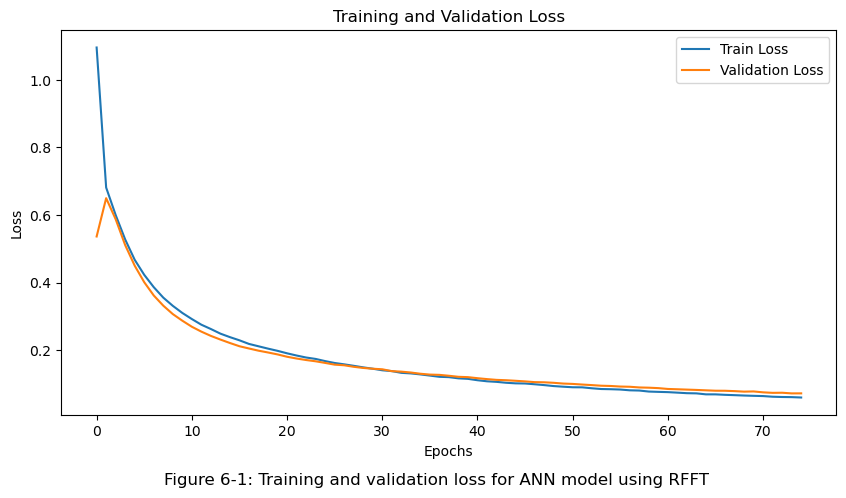

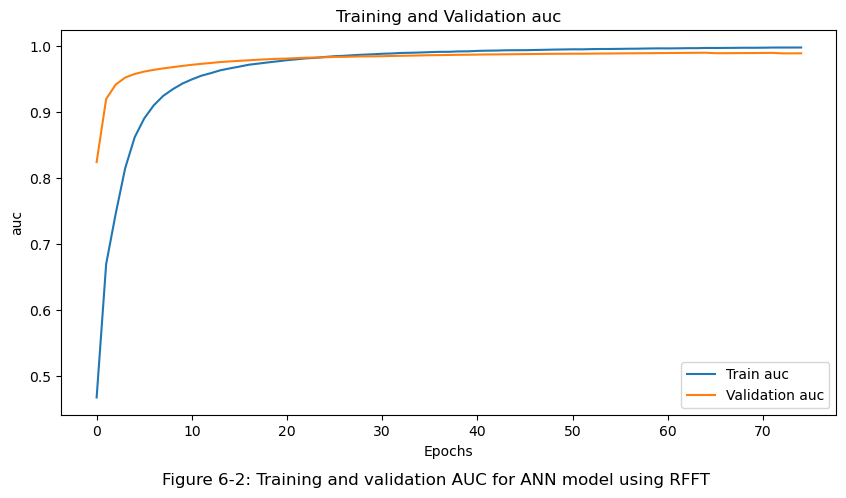

8/8 [==============================] - 0s 2ms/step
y_pred_prob
(15620,)
y_true
(15620,)
Accuracy: 0.9679
Precision: 0.4828
Recall: 0.9236
F1-Score: 0.6341
AUC: 0.9864


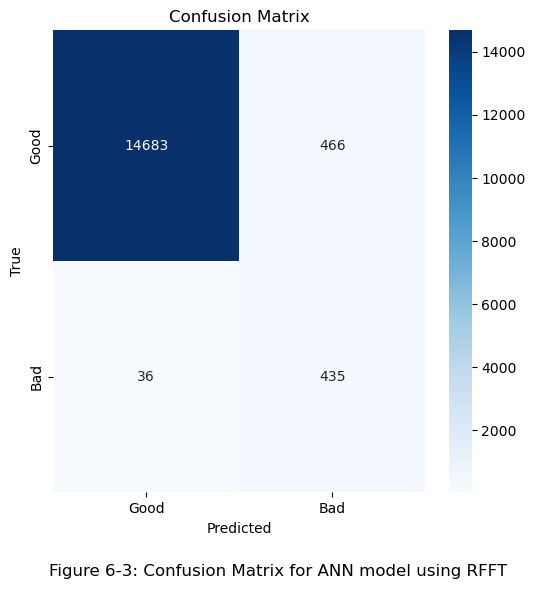

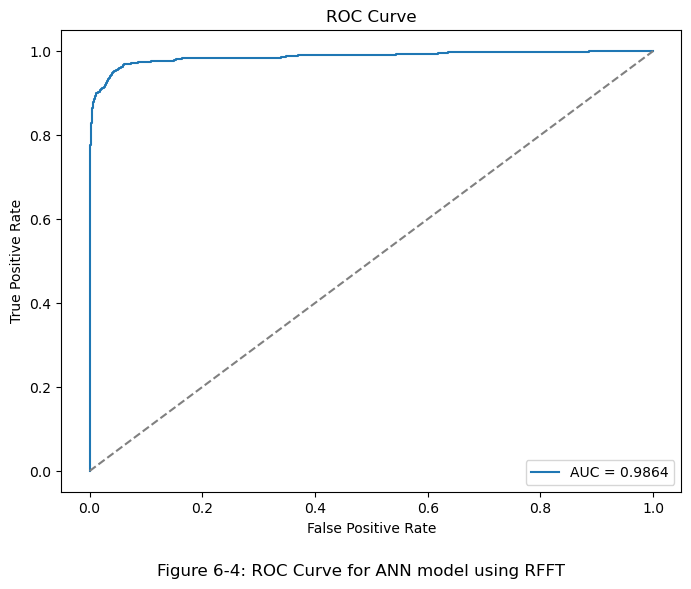

In [20]:
# Regular ANN model trained on RFFT output after chunking it into 1 second increments
model_name = "ann_RFFT_PCA"

def train_model(dataset):

    model = Sequential([
    Dense(1025, activation='relu', input_shape=(dataset["training_shape"][1],)),
    Dropout(0.2),
    Dense(512, activation='relu'),
    Dropout(0.2),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')  # Binary classification
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                  loss='binary_crossentropy',
                  metrics=pca_ANN_dataset["metrics"])

    callback = EarlyStopping(monitor='val_auc', patience=10, restore_best_weights=True)

    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=100,
                        callbacks = callback,
                        verbose=0)

    return model, history

pca_ANN_dataset = generate_new_datasets(batch=2048,
                                        chunks=True,
                                        apply_rfft=True,
                                        feature_reduction=True,
                                        balance_using_SMOT=True,
                                        good_only=False)

model, history = train_load_model(model_name, train_model, pca_ANN_dataset)

plot_training(history, metric="auc",
              figure1='Figure 6-1: Training and validation loss for ANN model using RFFT',
              figure2='Figure 6-2: Training and validation AUC for ANN model using RFFT')
evaluate_classification_model(model, pca_ANN_dataset["val_dataset"], threshold=0.5, model_name=model_name,
              figure1='Figure 6-3: Confusion Matrix for ANN model using RFFT',
              figure2='Figure 6-4: ROC Curve for ANN model using RFFT')


## 6.2 Autoencoder using ANN and RFFT

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(75989, 2048, 3) , bad chunks (2509, 2048, 3) train/val chunks (78498, 2048, 3))

Extracting RFFT features
X Type: <class 'numpy.ndarray'> and shape (78498, 3075)

Applying Standard Scaling
(78498, 3075)
X Type: <class 'numpy.ndarray'> and shape (78498, 3075)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62798, 3075)
Seperating good samples from bad samples for Autoencoder training


2025-05-08 21:50:19.392864: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:3c:00.0, compute capability: 8.9




Calculating Class Weights

Dataset ready for training with number of features of (60791, 3075)


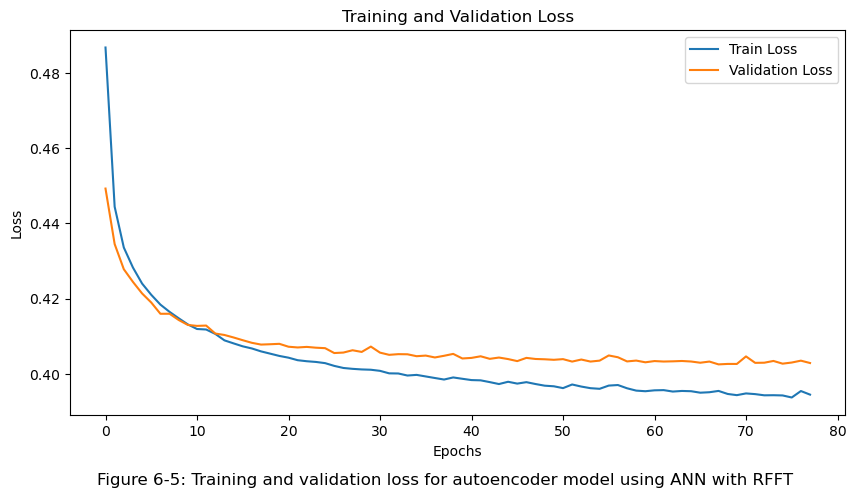

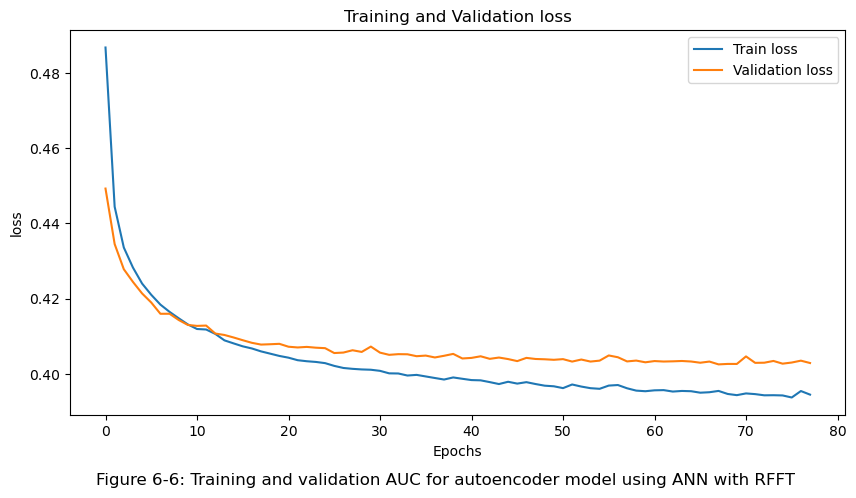

79/79 [==============================] - 0s 1ms/step
Threshold is: 1.1141854309704158
There are 1593 bad samples below the threshold out of a total of 2509
There are 760 good samples above the threshold out of a total of 15198


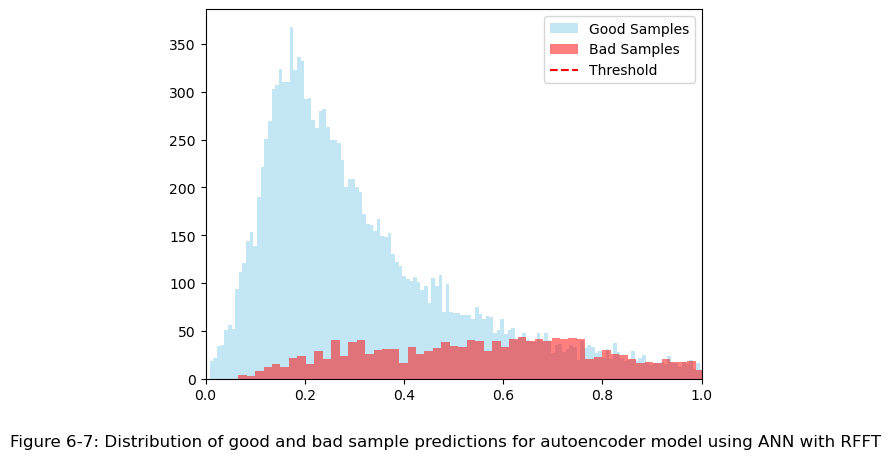

Accuracy: 0.8671
Precision: 0.5465
Recall: 0.3651
F1-Score: 0.4378
AUC: 0.8334


In [20]:
#Autoencoder model trained on RFFT date that is chunked into 1 sec increments
model_name = "autoencoder_ANN"


def train_model(dataset):

    model = Sequential([
    #Encoder
    Dense(2048, activation="relu",input_shape=(autoencoder_ANN_dataset["training_shape"][1],)),
    Dropout(0.2),
    Dense(1024, activation="relu"),
    Dropout(0.2),
    Dense(512, activation="relu"),
    Dense(256, activation="relu"),
    Dense(128, activation="relu"),

    #Decoder
    Dense(256, activation="relu"),
    Dense(512, activation="relu"),
    Dense(1024, activation="relu"),
    Dropout(0.2),
    Dense(2048, activation="relu"),
    Dense(autoencoder_ANN_dataset["training_shape"][1], activation='linear'),
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='mae')

    callback = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=200,
                        callbacks = callback,
                        verbose=1)
    return model, history


autoencoder_ANN_dataset = generate_new_datasets(batch=128,
                                                chunks=True,
                                                apply_rfft=True,
                                                feature_reduction=False, # Disabeling PCA since autoencode already does its own dimentionality reduction
                                                balance_using_SMOT=False,
                                                good_only=True)

model, history = train_load_model(model_name, train_model, autoencoder_ANN_dataset)

plot_training(history, metric="loss",
              figure1='Figure 6-5: Training and validation loss for autoencoder model using ANN with RFFT',
              figure2='Figure 6-6: Training and validation AUC for autoencoder model using ANN with RFFT')
evaluate_autoencoder_model(model, autoencoder_ANN_dataset, error_cutoff_percentile=95, model_name=model_name,
              figure1='Figure 6-7: Distribution of good and bad sample predictions for autoencoder model using ANN with RFFT')

## 6.3 LSTM on Acceleration

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(75525, 2048, 3) , bad chunks (2411, 2048, 3) train/val chunks (77936, 2048, 3))

Applying Standard Scaling
(77936, 2048, 3)
X Type: <class 'numpy.ndarray'> and shape (77936, 2048, 3)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62348, 2048, 3)


2025-05-09 07:44:24.029068: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:38:00.0, compute capability: 8.9




Calculating Class Weights

Dataset ready for training with number of features of (62348, 2048, 3)
Epoch 1/50


2025-05-09 07:44:31.985274: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-05-09 07:44:33.034168: I external/local_xla/xla/service/service.cc:168] XLA service 0x14fc5c0e50f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-09 07:44:33.034204: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-05-09 07:44:33.039307: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1746791073.108340   11237 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


488/488 [==============================] - 99s 195ms/step - loss: 0.4862 - accuracy: 0.7538 - precision: 0.0881 - recall: 0.7439 - auc: 0.8409 - val_loss: 0.4290 - val_accuracy: 0.8129 - val_precision: 0.1117 - val_recall: 0.7261 - val_auc: 0.8666
Epoch 2/50
488/488 [==============================] - 98s 200ms/step - loss: 0.4228 - accuracy: 0.7930 - precision: 0.1072 - recall: 0.7760 - auc: 0.8799 - val_loss: 0.4352 - val_accuracy: 0.7857 - val_precision: 0.1070 - val_recall: 0.8071 - val_auc: 0.8953
Epoch 3/50
488/488 [==============================] - 99s 204ms/step - loss: 0.3974 - accuracy: 0.8116 - precision: 0.1178 - recall: 0.7838 - auc: 0.8954 - val_loss: 0.3466 - val_accuracy: 0.8470 - val_precision: 0.1392 - val_recall: 0.7614 - val_auc: 0.8951
Epoch 4/50
488/488 [==============================] - 100s 204ms/step - loss: 0.3795 - accuracy: 0.8284 - precision: 0.1314 - recall: 0.8103 - auc: 0.9077 - val_loss: 0.4151 - val_accuracy: 0.8016 - val_precision: 0.1200 - val_recall:

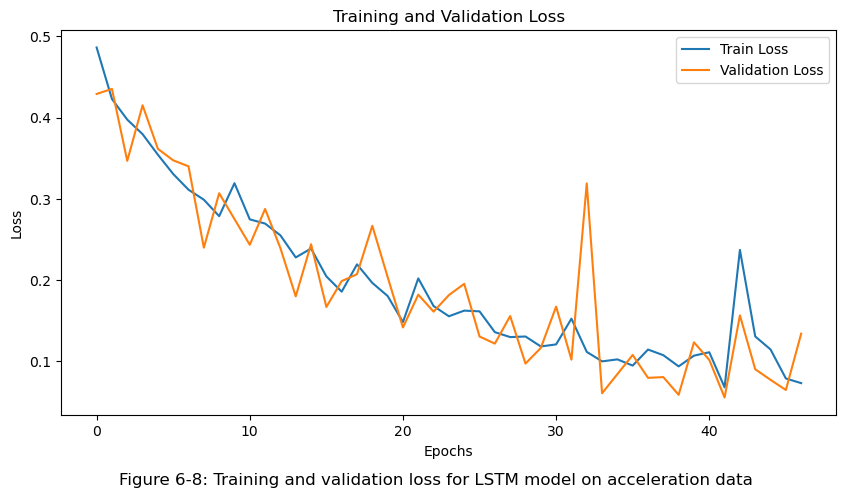

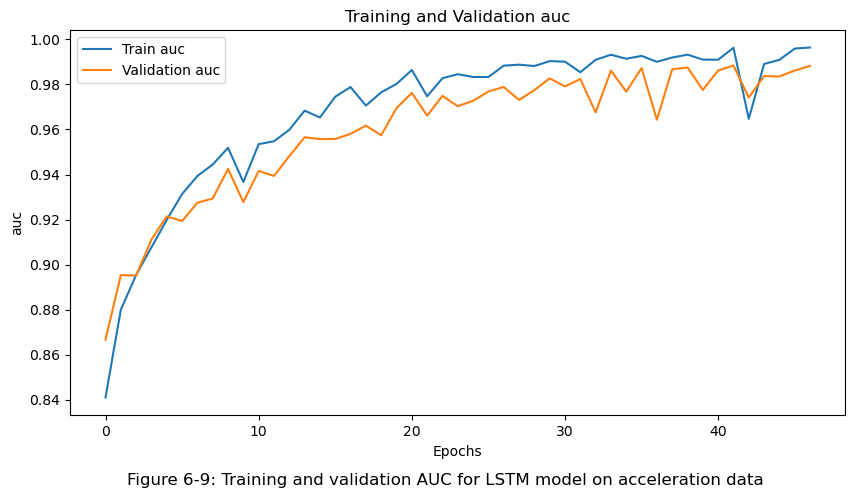

122/122 [==============================] - 9s 72ms/step
y_pred_prob
(15588,)
y_true
(15588,)
Accuracy: 0.9879
Precision: 0.7414
Recall: 0.9336
F1-Score: 0.8264
AUC: 0.9891


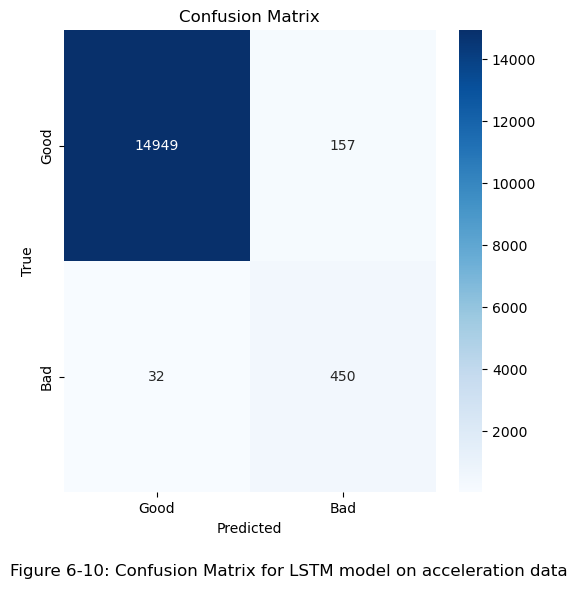

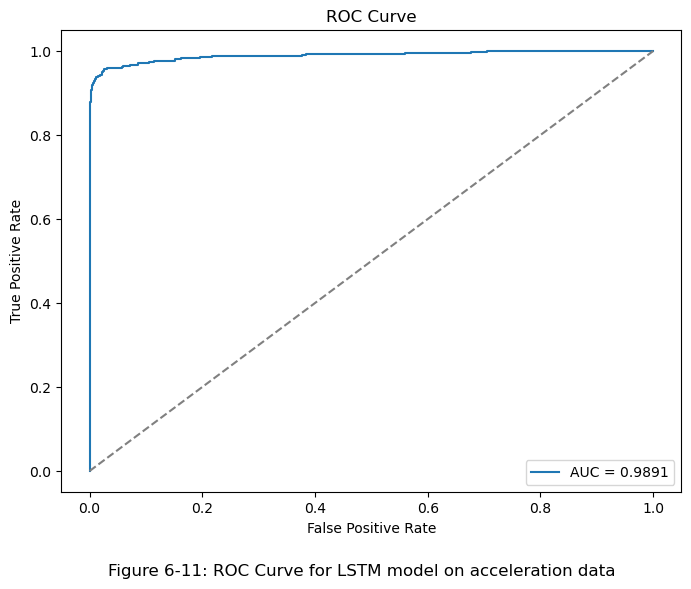

In [19]:
# LSTM model trained on acceleration data chunked into 1 sec increments

model_name = "lstm_acceleration"

def train_model(dataset):

    samples, timesteps, features = dataset["training_shape"]

    model = Sequential([
        LSTM(256, return_sequences=True, input_shape=(timesteps, features)),
        LayerNormalization(),
        LSTM(128, return_sequences=False),
        LayerNormalization(),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss='binary_crossentropy', metrics=dataset["metrics"])

    callback = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True)



    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=50,
                        callbacks = callback,
                        class_weight=dataset["class_weights"],
                        verbose=1)
    return model, history


lstm_on_acceleration_dataset = generate_new_datasets(batch=128,
                                    chunks=True,
                                    apply_rfft=False,
                                    feature_reduction=False,
                                    balance_using_SMOT=False, # balancing using class weights instead
                                    good_only=False)

model, history = train_load_model(model_name, train_model, lstm_on_acceleration_dataset)

plot_training(history, metric="auc",
              figure1='Figure 6-8: Training and validation loss for LSTM model on acceleration data',
              figure2='Figure 6-9: Training and validation AUC for LSTM model on acceleration data')
evaluate_classification_model(model, lstm_on_acceleration_dataset["val_dataset"], threshold=0.5, model_name=model_name,
              figure1='Figure 6-10: Confusion Matrix for LSTM model on acceleration data',
              figure2='Figure 6-11: ROC Curve for LSTM model on acceleration data')

## 6.4 Bidirectional LSTM

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(76247, 2048, 3) , bad chunks (2465, 2048, 3) train/val chunks (78712, 2048, 3))

Applying Standard Scaling
(78712, 2048, 3)
X Type: <class 'numpy.ndarray'> and shape (78712, 2048, 3)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62969, 2048, 3)


2025-05-09 12:58:26.345489: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:38:00.0, compute capability: 8.9




Calculating Class Weights

Dataset ready for training with number of features of (62969, 2048, 3)
Epoch 1/50


2025-05-09 12:58:36.553323: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-05-09 12:58:38.117179: I external/local_xla/xla/service/service.cc:168] XLA service 0x1457000b5310 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-09 12:58:38.117210: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-05-09 12:58:38.122129: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1746809918.190516   42587 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


492/492 [==============================] - 225s 444ms/step - loss: 0.4401 - accuracy: 0.7991 - precision: 0.1112 - recall: 0.7743 - auc: 0.8771 - val_loss: 0.2769 - val_accuracy: 0.8737 - val_precision: 0.1652 - val_recall: 0.7485 - val_auc: 0.9012
Epoch 2/50
492/492 [==============================] - 223s 454ms/step - loss: 0.3493 - accuracy: 0.8529 - precision: 0.1543 - recall: 0.8251 - auc: 0.9241 - val_loss: 0.2321 - val_accuracy: 0.9003 - val_precision: 0.2040 - val_recall: 0.7525 - val_auc: 0.9221
Epoch 3/50
492/492 [==============================] - 225s 458ms/step - loss: 0.3074 - accuracy: 0.8767 - precision: 0.1828 - recall: 0.8463 - auc: 0.9415 - val_loss: 0.2502 - val_accuracy: 0.8972 - val_precision: 0.2049 - val_recall: 0.7931 - val_auc: 0.9325
Epoch 4/50
492/492 [==============================] - 227s 460ms/step - loss: 0.2800 - accuracy: 0.8902 - precision: 0.2034 - recall: 0.8595 - auc: 0.9514 - val_loss: 0.2025 - val_accuracy: 0.9245 - val_precision: 0.2645 - val_reca

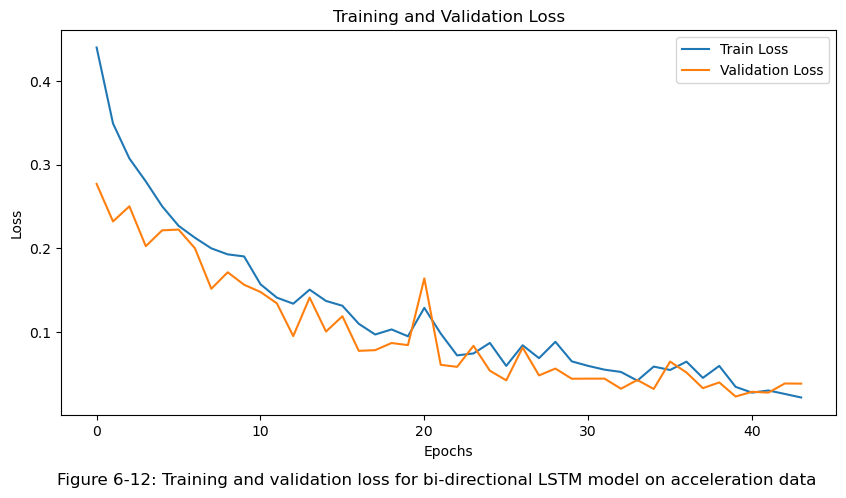

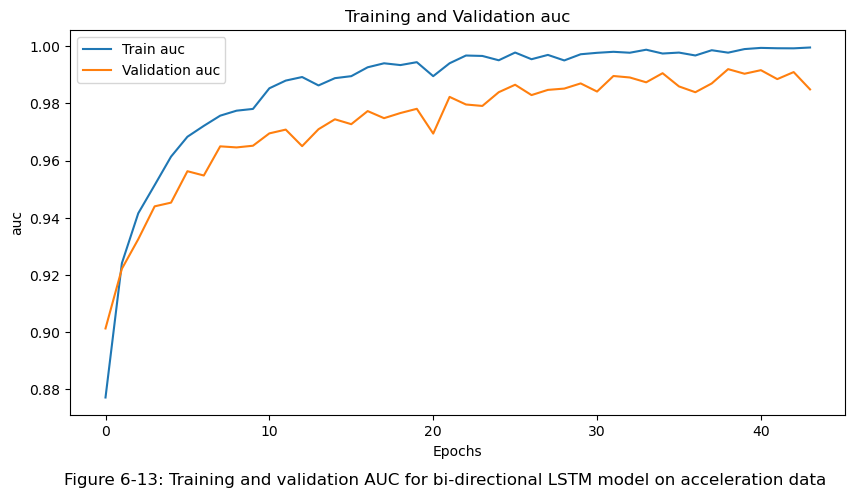

123/123 [==============================] - 21s 161ms/step
y_pred_prob
(15743,)
y_true
(15743,)
Accuracy: 0.9871
Precision: 0.7252
Recall: 0.9473
F1-Score: 0.8215
AUC: 0.9917


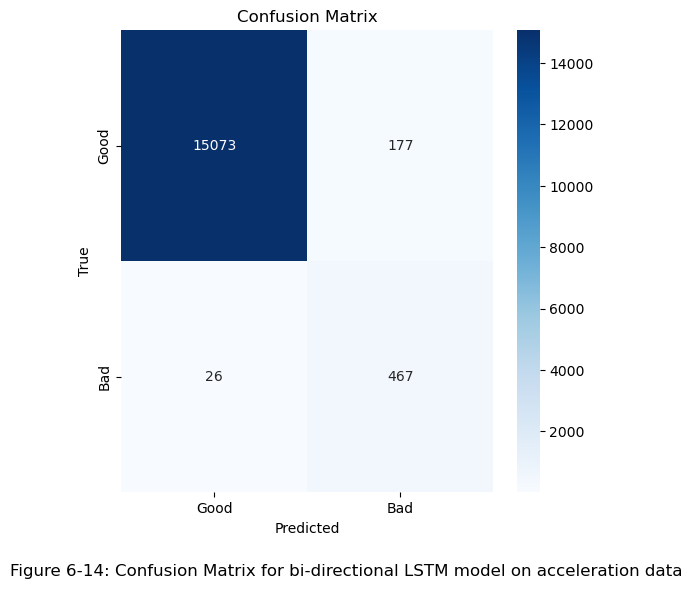

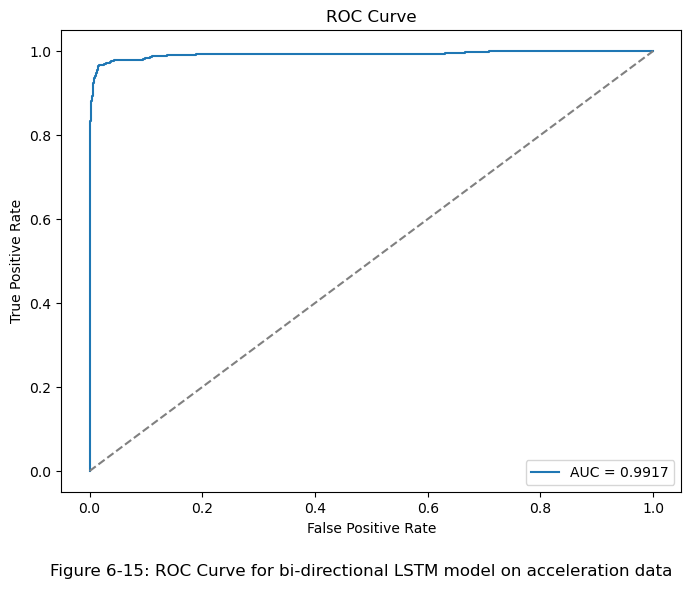

In [18]:
# Bidirectional model trained on acceleration data chunked into 1 sec increments

model_name = "bdLSTM_on_acceleration_dataset"

def train_model(dataset):
    samples, timesteps, features = dataset["training_shape"]

    model = Sequential([
        Bidirectional(LSTM(256, return_sequences=True, input_shape=(timesteps, features))),
        LayerNormalization(),
        Bidirectional(LSTM(128, return_sequences=False)),
        LayerNormalization(),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss='binary_crossentropy', metrics=dataset["metrics"])

    callback = EarlyStopping(monitor='val_auc', patience=5, restore_best_weights=True)

    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=50,
                        callbacks = callback,
                        class_weight=dataset["class_weights"],
                        verbose=1)

    return model, history

bdLSTM_on_acceleration_dataset = generate_new_datasets(batch=128,
                                    chunks=True,
                                    apply_rfft=False,
                                    feature_reduction=False,
                                    balance_using_SMOT=False, # balancing using class weights instead
                                    good_only=False)

model, history = train_load_model(model_name, train_model, bdLSTM_on_acceleration_dataset)

plot_training(history, metric="auc",
              figure1='Figure 6-12: Training and validation loss for bi-directional LSTM model on acceleration data',
              figure2='Figure 6-13: Training and validation AUC for bi-directional LSTM model on acceleration data')
evaluate_classification_model(model, bdLSTM_on_acceleration_dataset["val_dataset"], threshold=0.5, model_name=model_name,
              figure1='Figure 6-14: Confusion Matrix for bi-directional LSTM model on acceleration data',
              figure2='Figure 6-15: ROC Curve for bi-directional LSTM model on acceleration data')

## 6.5 1D CNN on acceleration

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(75917, 2048, 3) , bad chunks (2405, 2048, 3) train/val chunks (78322, 2048, 3))

Applying Standard Scaling
(78322, 2048, 3)
X Type: <class 'numpy.ndarray'> and shape (78322, 2048, 3)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62657, 2048, 3)


Calculating Class Weights

Dataset ready for training with number of features of (62657, 2048, 3)


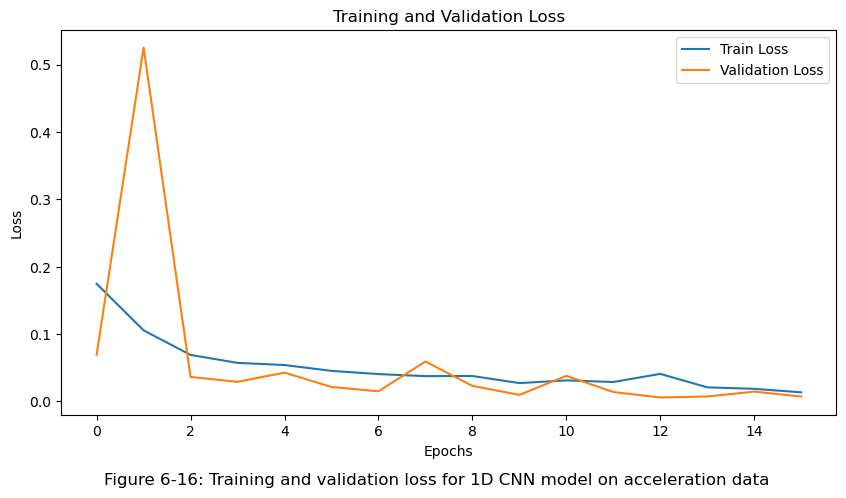

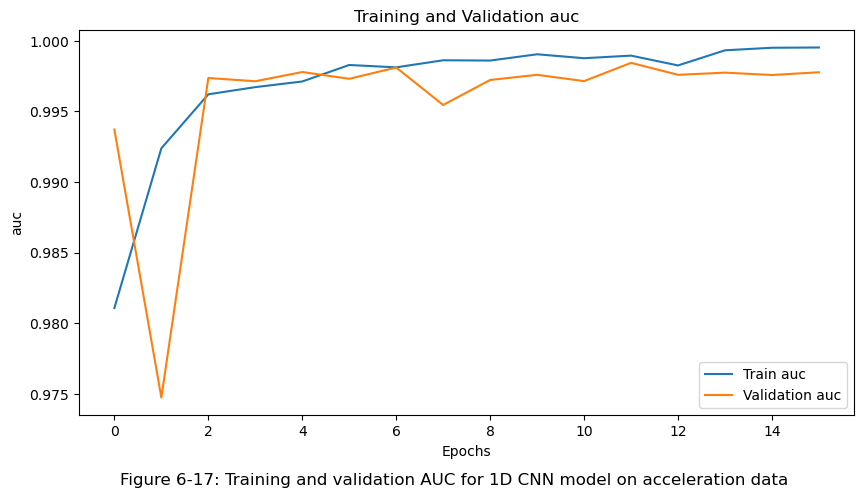

123/123 [==============================] - 2s 13ms/step
y_pred_prob
(15665,)
y_true
(15665,)
Accuracy: 0.9982
Precision: 0.9956
Recall: 0.9459
F1-Score: 0.9701
AUC: 0.9969


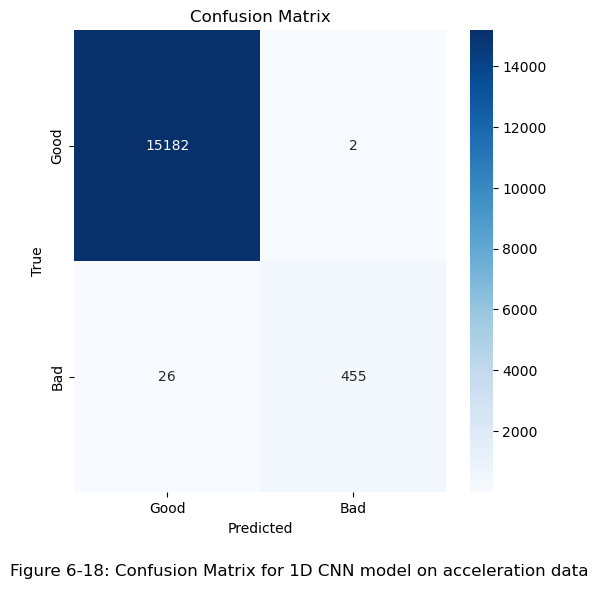

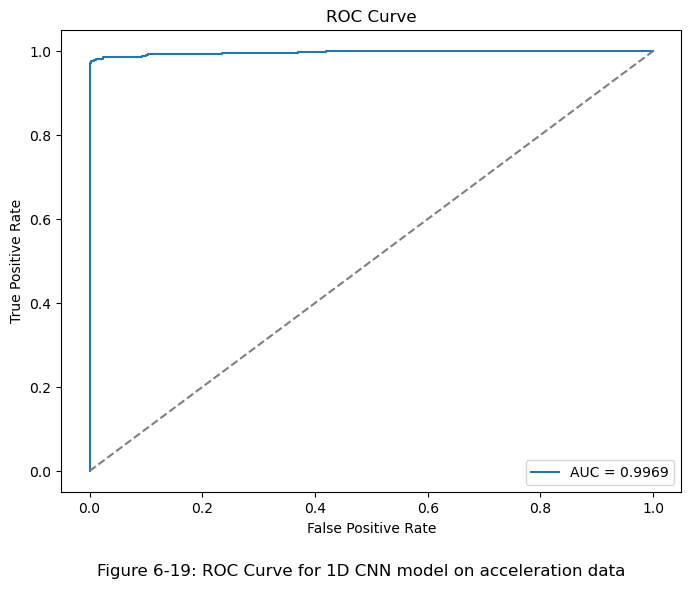

In [25]:
# 1D Conv model trained on acceleration data chunked into 1 sec increments

model_name = "cnn1d_on_acceleration"

def train_model(dataset):

    samples, timesteps, features = cnn1d_on_acceleration_dataset["training_shape"]

    model = Sequential([
        Conv1D(64, kernel_size=5, activation='relu', input_shape=(timesteps, features)),
        BatchNormalization(),
        MaxPooling1D(pool_size=2),

        Conv1D(128, kernel_size=5, activation='relu'),
        BatchNormalization(),
        MaxPooling1D(pool_size=2),

        Conv1D(256, kernel_size=5, activation='relu'),
        BatchNormalization(),
        MaxPooling1D(pool_size=2),

        GlobalAveragePooling1D(),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])


    metrics=['accuracy',
             Precision(name='precision'),
             Recall(name='recall'),
             AUC(name='auc')
                  ]

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='binary_crossentropy', metrics=metrics)

    callback = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)



    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=20,
                        callbacks = callback,
                        class_weight=dataset["class_weights"],
                        verbose=1)

    return model, history

cnn1d_on_acceleration_dataset = generate_new_datasets(batch=128,
                                    chunks=True,
                                    apply_rfft=False,
                                    feature_reduction=False,
                                    balance_using_SMOT=False, # balancing using class weights instead
                                    good_only=False)

model, history = train_load_model(model_name, train_model, cnn1d_on_acceleration_dataset)


plot_training(history, metric="auc",
              figure1='Figure 6-16: Training and validation loss for 1D CNN model on acceleration data',
              figure2='Figure 6-17: Training and validation AUC for 1D CNN model on acceleration data')
evaluate_classification_model(model, cnn1d_on_acceleration_dataset["val_dataset"], threshold=0.8, model_name=model_name,
              figure1='Figure 6-18: Confusion Matrix for 1D CNN model on acceleration data',
              figure2='Figure 6-19: ROC Curve for 1D CNN model on acceleration data')

## 6.6 Autoencoder 1D Conv

Loaded 1702 samples with 1702 labels.
Number of test bad full opperations: 7
Number of training and val bad full opperations: 63

Braking up dataset to chunks base on a window size of 2048
Shape of:
Good chunks:(75997, 2048, 3) , bad chunks (2503, 2048, 3) train/val chunks (78500, 2048, 3))

Applying Standard Scaling
(78500, 2048, 3)
X Type: <class 'numpy.ndarray'> and shape (78500, 2048, 3)

Splitting to training and validation with a 90/10 split
X Type: <class 'numpy.ndarray'> and shape (62800, 2048, 3)
Seperating good samples from bad samples for Autoencoder training


Calculating Class Weights

Dataset ready for training with number of features of (60798, 2048, 3)
Epoch 1/150


2025-05-09 10:37:05.261518: I external/local_xla/xla/service/service.cc:168] XLA service 0x14aa4c336420 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-09 10:37:05.261558: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-05-09 10:37:05.266443: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1746801425.340996   18333 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


950/950 [==============================] - 27s 17ms/step - loss: 0.4460 - mae: 0.4267 - val_loss: 0.3278 - val_mae: 0.3510 - lr: 5.0000e-04
Epoch 2/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3553 - mae: 0.3789 - val_loss: 0.3064 - val_mae: 0.3401 - lr: 5.0000e-04
Epoch 3/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3278 - mae: 0.3609 - val_loss: 0.2780 - val_mae: 0.3178 - lr: 5.0000e-04
Epoch 4/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3219 - mae: 0.3570 - val_loss: 0.2768 - val_mae: 0.3177 - lr: 5.0000e-04
Epoch 5/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3192 - mae: 0.3554 - val_loss: 0.2748 - val_mae: 0.3169 - lr: 5.0000e-04
Epoch 6/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3176 - mae: 0.3545 - val_loss: 0.2733 - val_mae: 0.3159 - lr: 5.0000e-04
Epoch 7/150
950/950 [==============================] - 15s 16ms/step - loss: 0.3164 - mae: 0.3539 - 

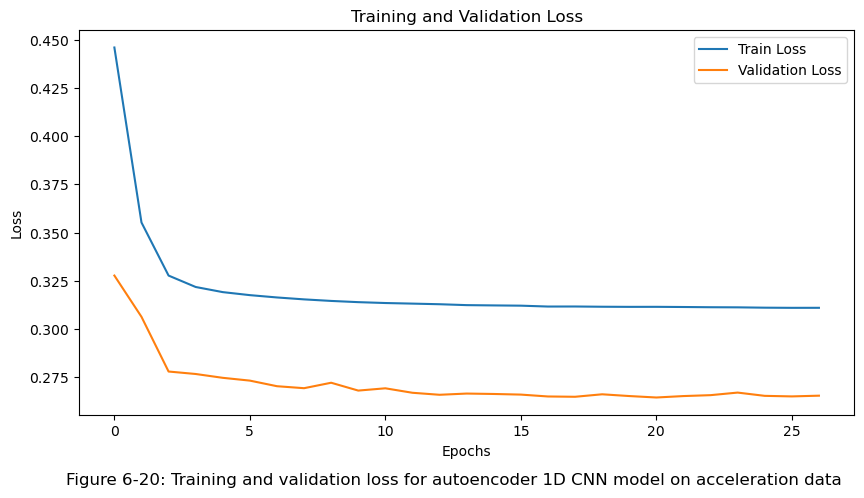

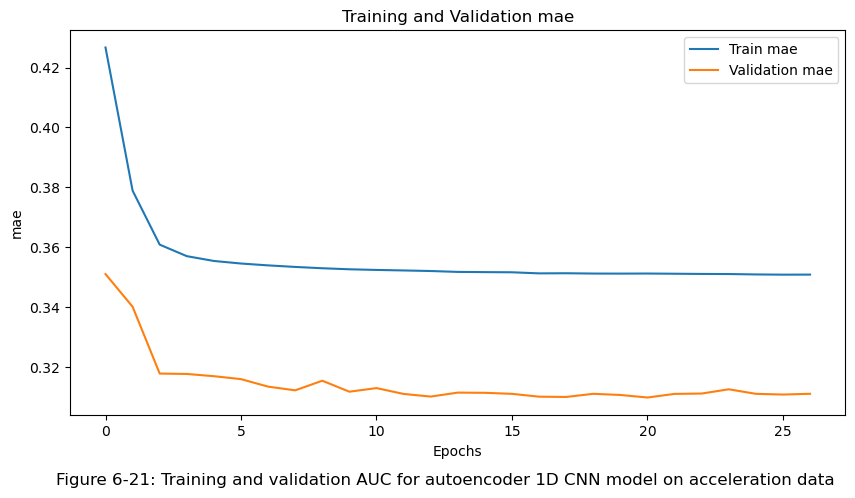

79/79 [==============================] - 0s 3ms/step
Threshold is: 0.7761909737383791
There are 2272 bad samples below the threshold out of a total of 2503
There are 760 good samples above the threshold out of a total of 15199


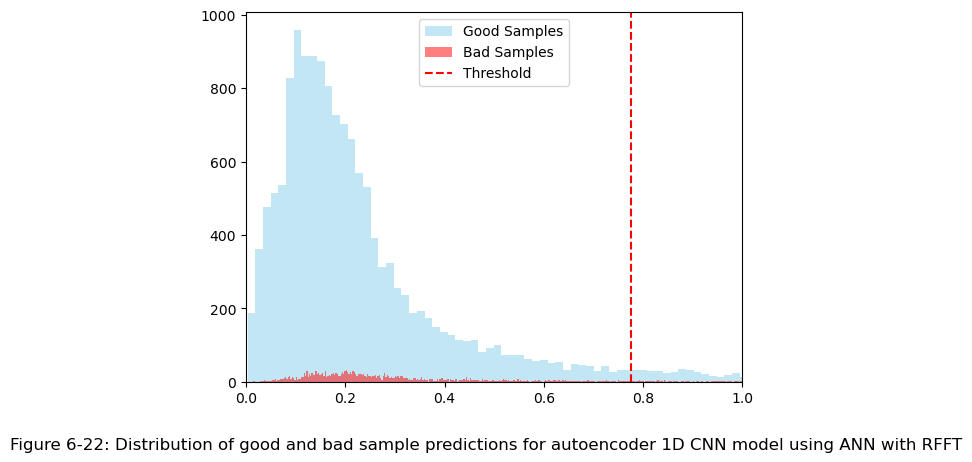

Accuracy: 0.8287
Precision: 0.2331
Recall: 0.0923
F1-Score: 0.1322
AUC: 0.6420


In [49]:
# Autoencoder using 1D Conv trained on acceleration data chunked into 1 sec increments
model_name = "autoencoder_cnn1d_on_acceleration"

def train_model(dataset):
    samples, timesteps, features = dataset["training_shape"]

    model = Sequential([
        #Encoder
        Conv1D(16, kernel_size=7, activation=None, padding='same', input_shape=(timesteps, features)),
        BatchNormalization(),
        MaxPooling1D(pool_size=2, padding='same'),
        Dropout(0.1),

        Conv1D(8, kernel_size=7, activation=None, padding='same'),
        BatchNormalization(),
        Dropout(0.1),
        MaxPooling1D(pool_size=2, padding='same'),

        Conv1D(4, kernel_size=5, activation=None, padding='same'),
        BatchNormalization(),

        #Decoder
        Conv1D(4, kernel_size=5, activation=None, padding='same'),
        BatchNormalization(),
        UpSampling1D(2),
        Dropout(0.1),

        Conv1D(8, kernel_size=5, activation=None, padding='same'),
        BatchNormalization(),
        UpSampling1D(2),
        Dropout(0.1),

        Conv1D(16, kernel_size=5, activation=None, padding='same'),
        BatchNormalization(),

        Conv1D(3, 3, activation='linear', padding='same')
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005, weight_decay=1e-5),
                                              loss="mse",        #tf.keras.losses.Huber(delta=0.5),
                                              metrics=["mae"])

    early_stopping = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)

    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=0.00001,
        verbose=1
    )

    history = model.fit(dataset["train_dataset"],
                        validation_data=dataset["val_dataset"],
                        epochs=150,
                        callbacks = [early_stopping,reduce_lr ],
                        verbose=1)

    return model, history

autoencoder_cnn1d_on_acceleration_dataset = generate_new_datasets(batch=64,
                                    chunks=True,
                                    apply_rfft=False,
                                    feature_reduction=False,
                                    balance_using_SMOT=False, # balancing using class weights instead
                                    good_only=True)

model, history = train_load_model(model_name, train_model, autoencoder_cnn1d_on_acceleration_dataset)

plot_training(history, metric="mae",
              figure1='Figure 6-20: Training and validation loss for autoencoder 1D CNN model on acceleration data',
              figure2='Figure 6-21: Training and validation AUC for autoencoder 1D CNN model on acceleration data')
evaluate_autoencoder_model(model, autoencoder_cnn1d_on_acceleration_dataset, error_cutoff_percentile=95, model_name=model_name,
              figure1='Figure 6-22: Distribution of good and bad sample predictions for autoencoder 1D CNN model using ANN with RFFT')

## 6.7 Champion Model (1D CNN on Acceleration) Evaluated on Test Data

Our best performing model was the 1D CNN on the time-series acceleration data only. The folowing cell is an evaluation of the model on unseen test data. Due to the stochastic nature of modeling/testing, the following is just an example of the test performance. The best performing 1D CNN we ran achieved 0 misclassifications for both "bad" and "good" samples

Shape of:
Good chunks:(8120, 2048, 3) , bad chunks (302, 2048, 3) train/val chunks (8422, 2048, 3))
264/264 [==============================] - 0s 1ms/step
Accuracy: 0.9996
Precision: 0.9934
Recall: 0.9967
F1-Score: 0.9950
AUC: 1.0000


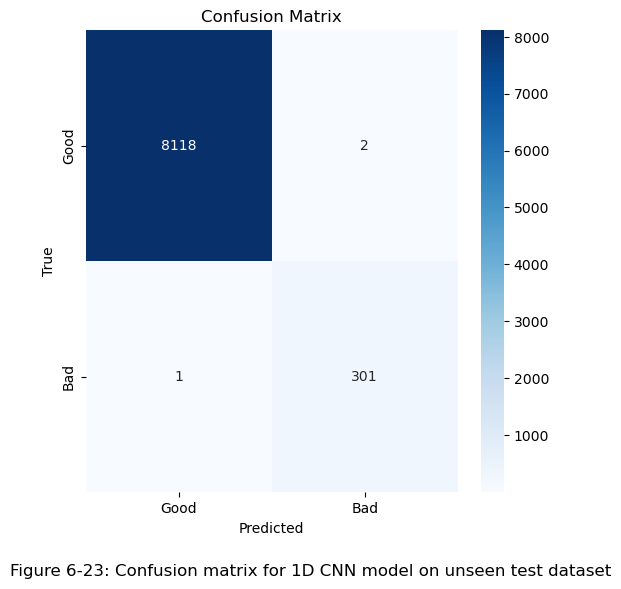

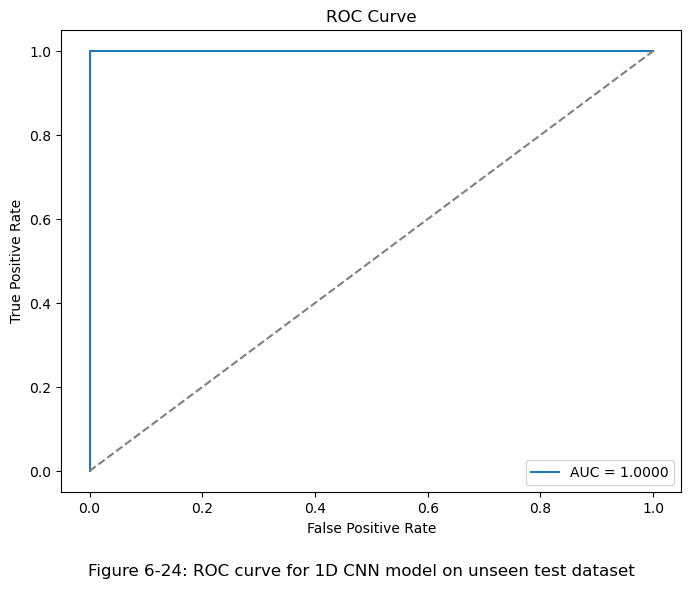

In [26]:
# testing 1dCNN with unseen test dataset

X_test = cnn1d_on_acceleration_dataset["X_test"]
y_test = cnn1d_on_acceleration_dataset["y_test"]
scaler = cnn1d_on_acceleration_dataset["scaler"]

window_size = 2048

# Splitting
X_test, y_test = break_data_to_windows(X_test,y_test, window_size = window_size)

# Scaling
n_samples, timesteps, n_features = X_test.shape
X_2d = X_test.reshape(-1, n_features)
X_scaled_2d = scaler.transform(X_2d)
X_scaled = X_scaled_2d.reshape(n_samples, timesteps, n_features)

# Get the predicted probabilities for the validation set
y_pred_prob  = model.predict(X_scaled)

# Calculate AUC using the raw probabilities (not thresholded predictions)
auc = roc_auc_score(y_test, y_pred_prob)

# Convert probabilities to binary predictions based on a threshold of 0.8
threshold=0.8
y_pred = (y_pred_prob >threshold).astype(int)

# Calculate other metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"AUC: {auc:.4f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Good', 'Bad'], yticklabels=['Good', 'Bad'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.figtext(0.5, -0.03, 'Figure 6-23: Confusion matrix for 1D CNN model on unseen test dataset', ha='center', fontsize=12)
plt.show()

# ROC Curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.figtext(0.5, -0.03, 'Figure 6-24: ROC curve for 1D CNN model on unseen test dataset', ha='center', fontsize=12)
plt.show()

# 7. References 

Tnani, M.-A., Feil, M., & Diepold, K. (2022). Smart data collection system for 	brownfield CNC milling machines: A new benchmark dataset for data-driven 	machine monitoring. In Proceedings of the 55th CIRP Conference on 	Manufacturing Systems. 	https://www.sciencedirect.com/science/article/pii/S2212827122002384

# Apendix

The appendix section contains experimental models which do not use the previously established data pipeline but still appear in our final results presentation.

## A.1 2D CNN using STFT with chunk size of 40000

In [29]:
# Set random seeds for reproducibility (updated to 109)
SEED = 109
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Parameters
sampling_rate = 2000
window_size = 64
noverlap = window_size // 2
freq_bins = 128
time_bins = 128
fixed_timesteps = 40000  # 20 seconds at 2000 Hz

# Define path to dataset (adjust for your OOD environment)
# Example: If data is in /scratch/user/data/CNC_Machining_main, update accordingly
path_to_dataset = Path("content/data")
if not path_to_dataset.exists():
    raise FileNotFoundError(f"Data directory {path_to_dataset} does not exist. Please upload and unzip CNC_Machining_main.zip.")

machines = ["M01", "M02", "M03"]
process_names = [f"OP{i:02d}" for i in range(15)]
labels = ["good", "bad"]

print(f"Data path set to: {path_to_dataset}")
print("Setup complete. Proceed to the next cell.")

Data path set to: content/data
Setup complete. Proceed to the next cell.


In [30]:
# Snippet 2: Data Loading Functions
# Purpose: Define functions to find .h5 files and standardize data shapes

# Find all .h5 files in a directory
def find_all_h5s_in_dir(s_dir):
    fileslist = []
    for root, _, files in os.walk(s_dir):
        for file in files:
            if file.endswith(".h5"):
                fileslist.append(os.path.join(root, file))
    return fileslist

# Standardize vibration data shape to a fixed length
def standardize_shape(data, fixed_length):
    current_length = data.shape[0]
    if current_length > fixed_length:
        return data[:fixed_length, :]
    elif current_length < fixed_length:
        padding = np.zeros((fixed_length - current_length, data.shape[1]))
        return np.vstack([data, padding])
    return data

print("Data loading functions defined. Proceed to the next cell.")

Data loading functions defined. Proceed to the next cell.


In [31]:
# Snippet 3: Load Data
# Purpose: Load vibration data from .h5 files and assign labels

X_data, y_data = [], []
machine_counts = {machine: {"good": 0, "bad": 0} for machine in machines}

# Iterate over all combinations of machines, processes, and labels
for process_name, machine, label in itertools.product(process_names, machines, labels):
    data_path = path_to_dataset / machine / process_name / label
    if not data_path.exists():
        continue
    h5_files = find_all_h5s_in_dir(data_path)
    machine_counts[machine][label] += len(h5_files)
    for file in h5_files:
        with h5py.File(file, 'r') as f:
            vibration_data = f['vibration_data'][:]
        vibration_data = standardize_shape(vibration_data, fixed_timesteps)
        X_data.append(vibration_data)
        y_data.append(0 if label == "good" else 1)

# Convert to numpy arrays
X_data, y_data = np.array(X_data), np.array(y_data)

# Print summary
print(f"Total samples loaded: {len(X_data)}")
print("Samples per machine:", machine_counts)
print(f"Good samples: {np.sum(y_data == 0)}, Bad samples: {np.sum(y_data == 1)}")

# Check if data is available
if len(X_data) == 0:
    raise ValueError("No data loaded. Check dataset path or .h5 files.")
if np.sum(y_data == 1) == 0:
    raise ValueError("No Bad samples found. Cannot proceed with classification.")

Total samples loaded: 1702
Samples per machine: {'M01': {'good': 485, 'bad': 34}, 'M02': {'good': 617, 'bad': 27}, 'M03': {'good': 530, 'bad': 9}}
Good samples: 1632, Bad samples: 70


In [34]:
# Snippet 4: Data Split and STFT Computation
# Purpose: Split data into train/validation/test sets and compute STFT spectrograms

# Initial train/test split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X_data, y_data, test_size=0.2, stratify=y_data, random_state=SEED
)
print(f"Initial split: {len(X_train)} training samples, {len(X_test)} test samples")
print(f"Training: {np.sum(y_train == 0)} Good, {np.sum(y_train == 1)} Bad")
print(f"Test: {np.sum(y_test == 0)} Good, {np.sum(y_test == 1)} Bad")

# Further split train into train/validation (90% train, 10% validation of the 80% train)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, stratify=y_train, random_state=SEED
)
print(f"Validation split: {len(X_train)} training samples, {len(X_val)} validation samples")
print(f"Training: {np.sum(y_train == 0)} Good, {np.sum(y_train == 1)} Bad")
print(f"Validation: {np.sum(y_val == 0)} Good, {np.sum(y_val == 1)} Bad")

# Compute STFT
def compute_stft(data, fs, nperseg, noverlap, freq_bins, time_bins):
    if len(data) == 0:
        raise ValueError("Input data is empty. Cannot compute STFT.")
    X_stft = []
    for sample in data:
        stft_x = np.abs(stft(sample[:, 0], fs=fs, nperseg=nperseg, noverlap=noverlap)[2])
        stft_y = np.abs(stft(sample[:, 1], fs=fs, nperseg=nperseg, noverlap=noverlap)[2])
        stft_z = np.abs(stft(sample[:, 2], fs=fs, nperseg=nperseg, noverlap=noverlap)[2])
        stft_x = zoom(stft_x, (freq_bins / stft_x.shape[0], time_bins / stft_x.shape[1]))
        stft_y = zoom(stft_y, (freq_bins / stft_y.shape[0], time_bins / stft_y.shape[1]))
        stft_z = zoom(stft_z, (freq_bins / stft_z.shape[0], time_bins / stft_z.shape[1]))
        stft_sample = np.stack([stft_x, stft_y, stft_z], axis=-1)
        X_stft.append(stft_sample)
    return np.array(X_stft)

# Compute STFT for train, validation, and test sets
X_train_stft = compute_stft(X_train, fs=sampling_rate, nperseg=window_size, noverlap=noverlap,
                            freq_bins=freq_bins, time_bins=time_bins)
X_val_stft = compute_stft(X_val, fs=sampling_rate, nperseg=window_size, noverlap=noverlap,
                          freq_bins=freq_bins, time_bins=time_bins)
X_test_stft = compute_stft(X_test, fs=sampling_rate, nperseg=window_size, noverlap=noverlap,
                           freq_bins=freq_bins, time_bins=time_bins)

# Normalize with checks
if X_train_stft.size > 0:
    X_train_stft = (X_train_stft - X_train_stft.mean()) / X_train_stft.std()
else:
    raise ValueError("X_train_stft is empty after STFT computation.")
if X_val_stft.size > 0:
    X_val_stft = (X_val_stft - X_val_stft.mean()) / X_val_stft.std()
else:
    raise ValueError("X_val_stft is empty after STFT computation.")
if X_test_stft.size > 0:
    X_test_stft = (X_test_stft - X_test_stft.mean()) / X_test_stft.std()
else:
    raise ValueError("X_test_stft is empty after STFT computation.")

print("STFT computation and normalization complete.")
print(f"X_train_stft shape: {X_train_stft.shape}")
print(f"X_val_stft shape: {X_val_stft.shape}")
print(f"X_test_stft shape: {X_test_stft.shape}")

Initial split: 1361 training samples, 341 test samples
Training: 1305 Good, 56 Bad
Test: 327 Good, 14 Bad
Validation split: 1224 training samples, 137 validation samples
Training: 1174 Good, 50 Bad
Validation: 131 Good, 6 Bad
STFT computation and normalization complete.
X_train_stft shape: (1224, 128, 128, 3)
X_val_stft shape: (137, 128, 128, 3)
X_test_stft shape: (341, 128, 128, 3)


In [37]:
# Snippet 5: Define and Train CNN Model
# Purpose: Define the CNN architecture and train with validation set

# Define CNN (Functional API)
def create_model():
    inputs = Input(shape=(freq_bins, time_bins, 3), name='input')
    x = Conv2D(32, (3, 3), activation='relu', name='conv1')(inputs)
    x = MaxPooling2D((2, 2), name='pool1')(x)
    x = Conv2D(64, (3, 3), activation='relu', name='conv2')(x)
    x = MaxPooling2D((2, 2), name='pool2')(x)
    x = Conv2D(128, (3, 3), activation='relu', name='conv3')(x)
    x = MaxPooling2D((2, 2), name='pool3')(x)
    x = Flatten(name='flatten')(x)
    x = Dense(256, activation='relu', name='dense1')(x)
    x = Dropout(0.3, name='dropout1')(x)
    x = Dense(128, activation='relu', name='dense2')(x)
    x = Dropout(0.3, name='dropout2')(x)
    outputs = Dense(1, activation='sigmoid', name='output')(x)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Train model with validation set
class_weight = {0: 1.0, 1: len(y_train[y_train == 0]) / len(y_train[y_train == 1])}
model = create_model()
print("\nModel Summary:")
model.summary()

# Train the model using validation set
history = model.fit(X_train_stft, y_train, validation_data=(X_val_stft, y_val),
                    epochs=50, batch_size=32, class_weight=class_weight,
                    callbacks=[EarlyStopping(patience=20)], verbose=1)

# Evaluate on validation set
y_val_pred = (model.predict(X_val_stft) > 0.5).astype(int)
print("\nValidation Classification Report:")
print(classification_report(y_val, y_val_pred, target_names=["Good", "Bad"], zero_division=0))
f1_bad = f1_score(y_val, y_val_pred, pos_label=1)
print(f"F1-score for Bad class on validation set: {f1_bad:.3f}")

print("Model training and evaluation complete. Proceed to the next cell.")


Model Summary:
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 128, 128, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 126, 126, 32)      896       
                                                                 
 pool1 (MaxPooling2D)        (None, 63, 63, 32)        0         
                                                                 
 conv2 (Conv2D)              (None, 61, 61, 64)        18496     
                                                                 
 pool2 (MaxPooling2D)        (None, 30, 30, 64)        0         
                                                                 
 conv3 (Conv2D)              (None, 28, 28, 128)       73856     
                                                                 
 pool3 (MaxPooling2D)        (None, 14, 14, 1

2025-05-09 11:05:11.355948: I external/local_xla/xla/service/service.cc:168] XLA service 0x14a8e7c6c070 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-09 11:05:11.355979: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-05-09 11:05:11.360792: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1746803111.439750   19452 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


39/39 [==============================] - 4s 23ms/step - loss: 1.2399 - accuracy: 0.6822 - val_loss: 0.1161 - val_accuracy: 0.9708
Epoch 2/50
39/39 [==============================] - 0s 12ms/step - loss: 0.5620 - accuracy: 0.8946 - val_loss: 0.0768 - val_accuracy: 0.9781
Epoch 3/50
39/39 [==============================] - 0s 12ms/step - loss: 0.2481 - accuracy: 0.9600 - val_loss: 0.1451 - val_accuracy: 0.9562
Epoch 4/50
39/39 [==============================] - 0s 12ms/step - loss: 0.3320 - accuracy: 0.9387 - val_loss: 0.1895 - val_accuracy: 0.9270
Epoch 5/50
39/39 [==============================] - 0s 11ms/step - loss: 0.1800 - accuracy: 0.9730 - val_loss: 0.1176 - val_accuracy: 0.9708
Epoch 6/50
39/39 [==============================] - 0s 11ms/step - loss: 0.2915 - accuracy: 0.9722 - val_loss: 0.0702 - val_accuracy: 0.9854
Epoch 7/50
39/39 [==============================] - 0s 11ms/step - loss: 0.1270 - accuracy: 0.9828 - val_loss: 0.0529 - val_accuracy: 0.9854
Epoch 8/50
39/39 [======

11/11 [==============================] - 0s 4ms/step

=== Test Set Confusion Matrix ===
Rows = Actual Labels, Columns = Predicted Labels
       Predicted Good | Predicted Bad
Actual Good       327              0
Actual Bad          0             14

=== Test Set Classification Report ===
              precision    recall  f1-score   support

        Good       1.00      1.00      1.00       327
         Bad       1.00      1.00      1.00        14

    accuracy                           1.00       341
   macro avg       1.00      1.00      1.00       341
weighted avg       1.00      1.00      1.00       341



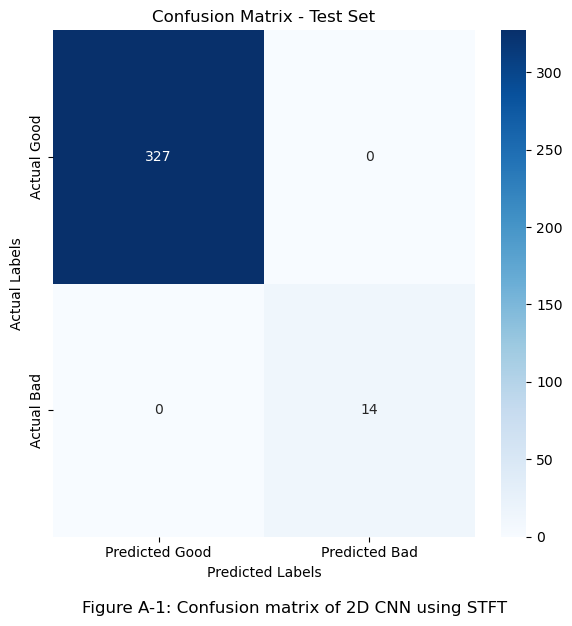


=== Test Set AUC Score ===
AUC: 1.0000


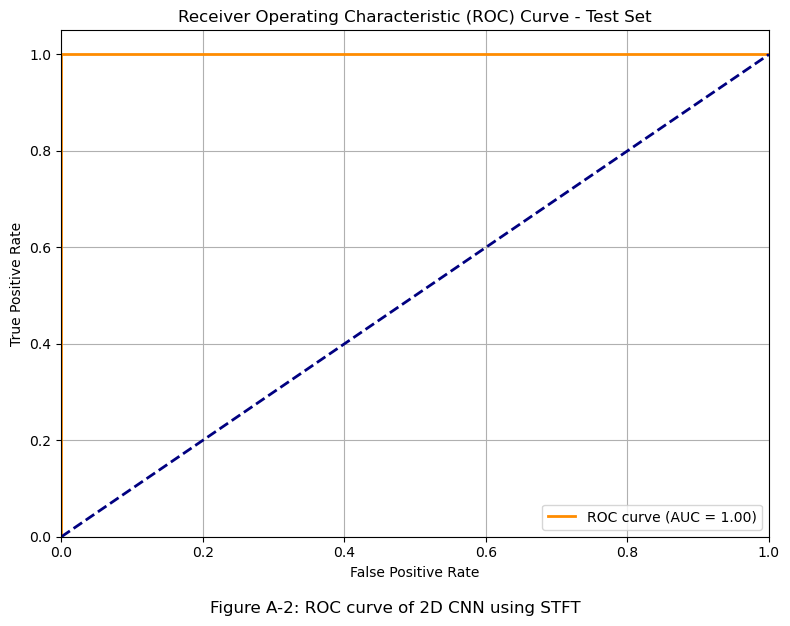

Evaluation complete. Proceed to the next cell.


In [41]:
from sklearn.metrics import auc
# Evaluate on test set
y_pred = (model.predict(X_test_stft) > 0.5).astype(int)
y_pred_proba = model.predict(X_test_stft)  # Get probability scores for ROC

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("\n=== Test Set Confusion Matrix ===")
print("Rows = Actual Labels, Columns = Predicted Labels")
print("       Predicted Good | Predicted Bad")
print(f"Actual Good     {conf_matrix[0, 0]:>5}          {conf_matrix[0, 1]:>5}")
print(f"Actual Bad      {conf_matrix[1, 0]:>5}          {conf_matrix[1, 1]:>5}")

# Classification Report
print("\n=== Test Set Classification Report ===")
print(classification_report(y_test, y_pred, target_names=["Good", "Bad"], zero_division=0))

# Plot Confusion Matrix as Heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=["Predicted Good", "Predicted Bad"], 
            yticklabels=["Actual Good", "Actual Bad"])
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.figtext(0.5, -0.03, 'Figure A-1: Confusion matrix of 2D CNN using STFT', ha='center', fontsize=12)

plt.tight_layout()
plt.show()

# ROC Curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Print AUC Score
print("\n=== Test Set AUC Score ===")
print(f"AUC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Test Set')
plt.legend(loc="lower right")
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure A-2: ROC curve of 2D CNN using STFT', ha='center', fontsize=12)
plt.tight_layout()
plt.show()

print("Evaluation complete. Proceed to the next cell.")

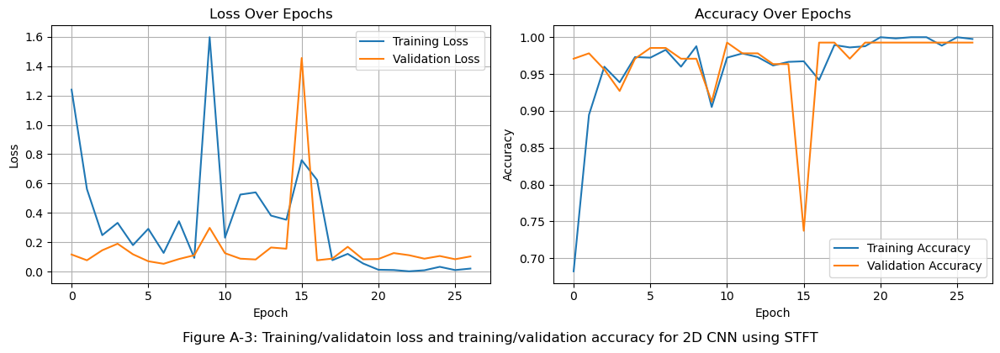

In [43]:
# Snippet 8: Plot Training History (Inline Display)
# Purpose: Plot training and validation loss/accuracy over epochs directly in the notebook

# Enable inline plotting
%matplotlib inline

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.tight_layout()
plt.figtext(0.5, -0.03, 'Figure A-3: Training/validatoin loss and training/validation accuracy for 2D CNN using STFT', ha='center', fontsize=12)

plt.show()
plt.close()

## A.2 Autoencoder ANN

In [5]:
# Function to normalize each sample
def normalize_samples(data_list):
    normalized_data = []
    for sample in data_list:
        # Normalize each axis independently
        scaler = StandardScaler()
        normalized = scaler.fit_transform(sample)
        normalized_data.append(normalized)
    return normalized_data

# Normalize the data
good_X_normalized = normalize_samples(good_X_data)
bad_X_normalized = normalize_samples(bad_X_data)

In [6]:
# Function to prepare sequences for LSTM (fixed length by truncating/padding)
def prepare_sequences(data_list, max_length=30000):
    prepared_sequences = []
    for sample in data_list:
        if len(sample) > max_length:
            # Truncate longer sequences
            prepared_sequences.append(sample[:max_length])
        else:
            # Pad shorter sequences with zeros
            padded = np.zeros((max_length, sample.shape[1]))
            padded[:len(sample)] = sample
            prepared_sequences.append(padded)
    return np.array(prepared_sequences)

# Alternatively, use variable-length sequences with batching:
def create_windowed_sequences(data_list, window_size=128, step=64):
    sequences = []
    for sample in data_list:
        for i in range(0, len(sample) - window_size + 1, step):
            sequences.append(sample[i:i+window_size])
    return np.array(sequences)

# Function to Create flattened time + FFT mag
def create_combined_features(data_list, window_size, step, fs=2000):
    sequences = []
    skipped_samples = 0
    for i, sample in enumerate(data_list):
        if len(sample) < window_size:
            skipped_samples += 1
            continue

        for start in range(0, len(sample) - window_size + 1, step):
            window = sample[start : start + window_size] # Shape: (window_size, 3)

            # 1. Flattened Time-Domain Data
            time_flat = window.flatten() # Shape: (window_size * 3,)

            # 2. FFT Magnitude Features
            fft_features = []
            for axis in range(window.shape[1]): # Iterate through X, Y, Z
                fft_vals = rfft(window[:, axis])
                fft_mag = np.abs(fft_vals) # Shape: (window_size // 2 + 1,)
                fft_features.extend(fft_mag)
            fft_flat = np.array(fft_features) # Shape: (3 * (window_size // 2 + 1),)

            # 3. Concatenate
            combined_vector = np.concatenate((time_flat, fft_flat))
            sequences.append(combined_vector)

    return np.array(sequences)


# Split the good data into train and validation
good_train, good_val = train_test_split(good_X_normalized, test_size=0.2, random_state=42)

# Create windowed sequences for training
model_window_size  = 256  # 256 samples = 128ms at 2kHz
model_step_size  = 128  # 50% overlap
sampling_rate = 2000

X_train_comb = create_combined_features(good_train, model_window_size, model_step_size, sampling_rate)
X_val_comb = create_combined_features(good_val, model_window_size, model_step_size, sampling_rate)

In [7]:
scaler_comb = StandardScaler()
X_train_comb_scaled = scaler_comb.fit_transform(X_train_comb)
X_val_comb_scaled = scaler_comb.transform(X_val_comb)

print(f"Scaled training data shape: {X_train_comb_scaled.shape}")
print(f"Scaled validation data shape: {X_val_comb_scaled.shape}")

Scaled training data shape: (1070551, 1155)
Scaled validation data shape: (279170, 1155)


In [8]:
def create_dense_autoencoder(input_dim):
    encoding_dim = 64
    print(f"Creating Dense AE for input_dim={input_dim}, encoding_dim={encoding_dim}")

    model = Sequential([
        Input(shape=(input_dim,), name='input_layer'),
        Dense(128, activation='relu', name='encoder_dense_1'),
        Dense(64, activation='relu', name='encoder_dense_2'),
        Dense(encoding_dim, activation='relu', name='bottleneck'), # Encoder bottleneck
        Dense(64, activation='relu', name='decoder_dense_1'),
        Dense(128, activation='relu', name='decoder_dense_2'),
        Dense(input_dim, activation='relu', name='output_layer') # Use ReLU/Linear for non-scaled outputs like FFT magnitudes
    ], name='Dense_Autoencoder')

    model.compile(optimizer='adam', loss='mse') # Mean Squared Error is common for AE
    return model

input_dimension = X_train_comb_scaled.shape[1]
model_fft = create_dense_autoencoder(input_dimension)

Creating Dense AE for input_dim=1155, encoding_dim=64


2025-05-09 16:29:10.832905: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:38:00.0, compute capability: 8.9


In [9]:
total_epochs_desired = 100
initial_epoch_to_start_from = 1

from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

checkpoint_filepath = 'model_files_v3/model_epoch_{epoch:02d}'
load_checkpoint_path = 'model_files_v3/model_epoch_24'

checkpoint_callback_fft = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_loss',
    mode='min',
    save_best_only=True, 
    verbose=1
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    mode='min',
    restore_best_weights=True
)

history_fft = model_fft.fit(
    X_train_comb_scaled, X_train_comb_scaled,  
    epochs=total_epochs_desired,
    initial_epoch=initial_epoch_to_start_from, 
    batch_size=32,
    validation_split=0.2,
    callbacks=[checkpoint_callback_fft, early_stopping],
    shuffle=True
)

Epoch 2/100


2025-05-09 16:29:22.179375: I external/local_xla/xla/service/service.cc:168] XLA service 0x14b2e49ec5d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-09 16:29:22.179411: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-05-09 16:29:22.184163: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-09 16:29:22.203391: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
I0000 00:00:1746822562.270376   44439 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


26751/26764 [============================>.] - ETA: 0s - loss: 0.6863
Epoch 2: val_loss improved from inf to 0.66246, saving model to model_files_v3/model_epoch_02
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_02/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_02/assets


26764/26764 [==============================] - 67s 2ms/step - loss: 0.6863 - val_loss: 0.6625
Epoch 3/100
26747/26764 [============================>.] - ETA: 0s - loss: 0.6586
Epoch 3: val_loss improved from 0.66246 to 0.65773, saving model to model_files_v3/model_epoch_03
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_03/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_03/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6586 - val_loss: 0.6577
Epoch 4/100
26757/26764 [============================>.] - ETA: 0s - loss: 0.6521
Epoch 4: val_loss improved from 0.65773 to 0.64893, saving model to model_files_v3/model_epoch_04
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_04/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_04/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6521 - val_loss: 0.6489
Epoch 5/100
26751/26764 [============================>.] - ETA: 0s - loss: 0.6490
Epoch 5: val_loss improved from 0.64893 to 0.64827, saving model to model_files_v3/model_epoch_05
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_05/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_05/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6490 - val_loss: 0.6483
Epoch 6/100
26754/26764 [============================>.] - ETA: 0s - loss: 0.6473
Epoch 6: val_loss did not improve from 0.64827
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6473 - val_loss: 0.6487
Epoch 7/100
26749/26764 [============================>.] - ETA: 0s - loss: 0.6462
Epoch 7: val_loss did not improve from 0.64827
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6462 - val_loss: 0.6487
Epoch 8/100
26755/26764 [============================>.] - ETA: 0s - loss: 0.6455
Epoch 8: val_loss improved from 0.64827 to 0.64374, saving model to model_files_v3/model_epoch_08
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_08/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_08/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6455 - val_loss: 0.6437
Epoch 9/100
26752/26764 [============================>.] - ETA: 0s - loss: 0.6452
Epoch 9: val_loss did not improve from 0.64374
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6452 - val_loss: 0.6440
Epoch 10/100
26746/26764 [============================>.] - ETA: 0s - loss: 0.6446
Epoch 10: val_loss did not improve from 0.64374
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6446 - val_loss: 0.6439
Epoch 11/100
26744/26764 [============================>.] - ETA: 0s - loss: 0.6443
Epoch 11: val_loss did not improve from 0.64374
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6443 - val_loss: 0.6439
Epoch 12/100
26749/26764 [============================>.] - ETA: 0s - loss: 0.6439
Epoch 12: val_loss did not improve from 0.64374
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6439 - val_loss: 0.6464
Epoch 13

INFO:tensorflow:Assets written to: model_files_v3/model_epoch_13/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6438 - val_loss: 0.6426
Epoch 14/100
26747/26764 [============================>.] - ETA: 0s - loss: 0.6432
Epoch 14: val_loss did not improve from 0.64257
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6432 - val_loss: 0.6467
Epoch 15/100
26745/26764 [============================>.] - ETA: 0s - loss: 0.6430
Epoch 15: val_loss improved from 0.64257 to 0.64140, saving model to model_files_v3/model_epoch_15
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_15/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_15/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6430 - val_loss: 0.6414
Epoch 16/100
26749/26764 [============================>.] - ETA: 0s - loss: 0.6427
Epoch 16: val_loss improved from 0.64140 to 0.64063, saving model to model_files_v3/model_epoch_16
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_16/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_16/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6427 - val_loss: 0.6406
Epoch 17/100
26759/26764 [============================>.] - ETA: 0s - loss: 0.6424
Epoch 17: val_loss did not improve from 0.64063
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6424 - val_loss: 0.6427
Epoch 18/100
26751/26764 [============================>.] - ETA: 0s - loss: 0.6421
Epoch 18: val_loss did not improve from 0.64063
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6421 - val_loss: 0.6465
Epoch 19/100
26754/26764 [============================>.] - ETA: 0s - loss: 0.6420
Epoch 19: val_loss improved from 0.64063 to 0.63970, saving model to model_files_v3/model_epoch_19
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_19/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_19/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6420 - val_loss: 0.6397
Epoch 20/100
26764/26764 [==============================] - ETA: 0s - loss: 0.6417
Epoch 20: val_loss did not improve from 0.63970
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6417 - val_loss: 0.6406
Epoch 21/100
26758/26764 [============================>.] - ETA: 0s - loss: 0.6415
Epoch 21: val_loss did not improve from 0.63970
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6415 - val_loss: 0.6398
Epoch 22/100
26757/26764 [============================>.] - ETA: 0s - loss: 0.6414
Epoch 22: val_loss did not improve from 0.63970
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6414 - val_loss: 0.6404
Epoch 23/100
26753/26764 [============================>.] - ETA: 0s - loss: 0.6409
Epoch 23: val_loss did not improve from 0.63970
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6409 - val_loss: 0.6407
Epoch 

INFO:tensorflow:Assets written to: model_files_v3/model_epoch_24/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6403 - val_loss: 0.6396
Epoch 25/100
26750/26764 [============================>.] - ETA: 0s - loss: 0.6399
Epoch 25: val_loss improved from 0.63964 to 0.63779, saving model to model_files_v3/model_epoch_25
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_25/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_25/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6399 - val_loss: 0.6378
Epoch 26/100
26760/26764 [============================>.] - ETA: 0s - loss: 0.6398
Epoch 26: val_loss did not improve from 0.63779
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6398 - val_loss: 0.6383
Epoch 27/100
26744/26764 [============================>.] - ETA: 0s - loss: 0.6397
Epoch 27: val_loss improved from 0.63779 to 0.63732, saving model to model_files_v3/model_epoch_27
INFO:tensorflow:Assets written to: model_files_v3/model_epoch_27/assets


INFO:tensorflow:Assets written to: model_files_v3/model_epoch_27/assets


26764/26764 [==============================] - 62s 2ms/step - loss: 0.6397 - val_loss: 0.6373
Epoch 28/100
26743/26764 [============================>.] - ETA: 0s - loss: 0.6396
Epoch 28: val_loss did not improve from 0.63732
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6396 - val_loss: 0.6396
Epoch 29/100
26760/26764 [============================>.] - ETA: 0s - loss: 0.6395
Epoch 29: val_loss did not improve from 0.63732
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6395 - val_loss: 0.6416
Epoch 30/100
26743/26764 [============================>.] - ETA: 0s - loss: 0.6395
Epoch 30: val_loss did not improve from 0.63732
26764/26764 [==============================] - 61s 2ms/step - loss: 0.6395 - val_loss: 0.6383
Epoch 31/100
26747/26764 [============================>.] - ETA: 0s - loss: 0.6393
Epoch 31: val_loss did not improve from 0.63732
26764/26764 [==============================] - 62s 2ms/step - loss: 0.6393 - val_loss: 0.6375
Epoch 

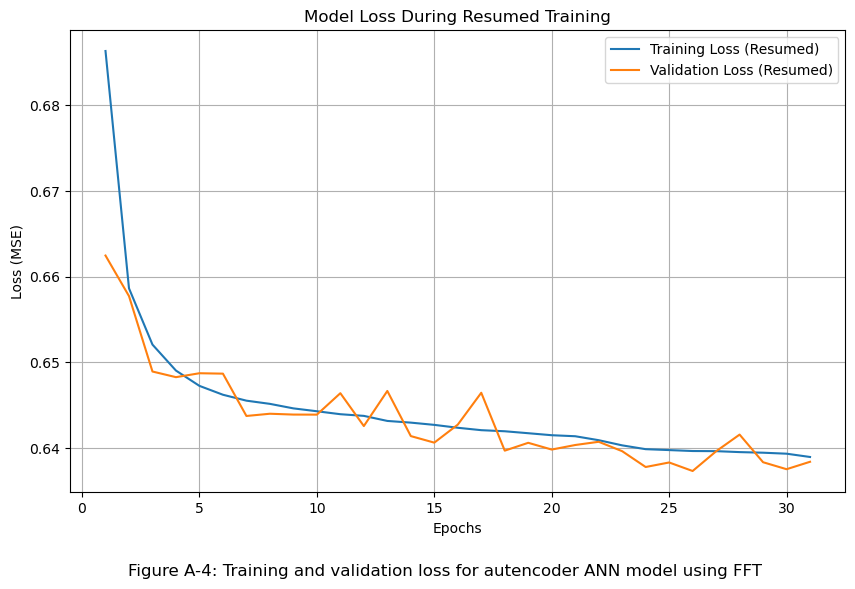


Saving final trained model to: final_lstm_autoencoder_model_v3.h5
Final model saved.


/shared/courseSharedFolders/142601outer/142601/cs109b/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [11]:
epochs_run_resumed = range(initial_epoch_to_start_from, initial_epoch_to_start_from + len(history_fft.history['loss']))

# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(epochs_run_resumed, history_fft.history['loss'], label='Training Loss (Resumed)')
plt.plot(epochs_run_resumed, history_fft.history['val_loss'], label='Validation Loss (Resumed)')
plt.title('Model Loss During Resumed Training')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure A-4: Training and validation loss for autencoder ANN model using FFT', ha='center', fontsize=12)
plt.show()


final_model_path = 'final_lstm_autoencoder_model_v3.h5'
print(f"\nSaving final trained model to: {final_model_path}")
model_fft.save(final_model_path)
print("Final model saved.")

8725/8725 [==============================] - 7s 837us/step

Evaluating good test samples (Combined)...
Evaluating Combined sequences with window=256, step=128...
Skipped 0 samples shorter than window size during evaluation.
Calculated errors for 1632 samples.

Evaluating bad test samples (Combined)...
Evaluating Combined sequences with window=256, step=128...
Skipped 0 samples shorter than window size during evaluation.
Calculated errors for 70 samples.


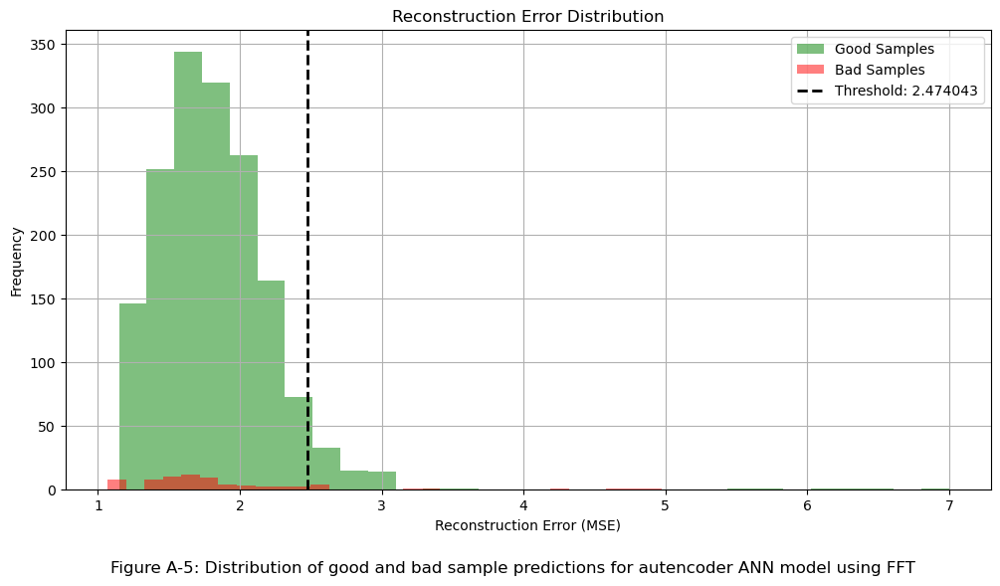


--- Performance Metrics (Combined Time+FFT Features) ---
Accuracy on 'good' samples (TNR): 95.28%
Accuracy on 'bad' samples (Recall/TPR): 14.29%
Overall accuracy: 91.95%
Precision: 11.49%
F1-Score: 12.74%


In [13]:
def evaluate_combined_sequences(data_list, window_size, step, model, scaler, fs=2000, error_metric_percentile=95):
    """Evaluates samples by calculating combined feature reconstruction error."""
    all_sample_errors = []
    print(f"Evaluating Combined sequences with window={window_size}, step={step}...")
    skipped_samples = 0

    for sample in data_list: # Iterate through original normalized samples
        if len(sample) < window_size:
            skipped_samples += 1
            continue

        window_features_list = []
        for start in range(0, len(sample) - window_size + 1, step):
            window = sample[start : start + window_size]
            # --- Recreate combined feature vector ---
            time_flat = window.flatten()
            fft_features = []
            for axis in range(window.shape[1]):
                fft_vals = rfft(window[:, axis])
                fft_mag = np.abs(fft_vals)
                fft_features.extend(fft_mag)
            fft_flat = np.array(fft_features)
            combined_vector = np.concatenate((time_flat, fft_flat))
            # --- Append the raw combined vector ---
            window_features_list.append(combined_vector)

        if not window_features_list:
            continue

        # --- Scale all combined vectors for this sample ---
        window_features_comb = np.array(window_features_list)
        try:
            # Important: Use the scaler fitted on training data
            window_features_comb_scaled = scaler.transform(window_features_comb)
        except ValueError as e:
             print(f"Skipping sample due to scaling error (likely shape issue): {e}")
             continue


        # Predict on scaled features
        predictions_comb_scaled = model.predict(window_features_comb_scaled, verbose=0)

        # Calculate MSE between scaled original and scaled prediction
        mse_per_window = np.mean(np.square(window_features_comb_scaled - predictions_comb_scaled), axis=1)

        # Calculate the error score for the entire sample
        sample_error = np.percentile(mse_per_window, error_metric_percentile)
        all_sample_errors.append(sample_error)

    print(f"Skipped {skipped_samples} samples shorter than window size during evaluation.")
    print(f"Calculated errors for {len(all_sample_errors)} samples.")
    return np.array(all_sample_errors)


# Get reconstruction error on validation set
val_predictions = model_fft.predict(X_val_comb_scaled)
val_mse = np.mean(np.square(X_val_comb_scaled - val_predictions), axis=1)

# Set threshold based on validation error distribution
# Common approach: mean + n * std
threshold = np.mean(val_mse) + 3 * np.std(val_mse)
# threshold = np.percentile(val_mse, 99)

# --- Evaluate Good and Bad Test Samples using Combined Features ---
print("\nEvaluating good test samples (Combined)...")
# Pass the fitted scaler!
good_test_errors_comb = evaluate_combined_sequences(good_X_normalized, model_window_size, model_step_size, model_fft, scaler_comb)
print("\nEvaluating bad test samples (Combined)...")
bad_test_errors_comb = evaluate_combined_sequences(bad_X_normalized, model_window_size, model_step_size, model_fft, scaler_comb)


# --- Plot Final Error Distributions (Combined) ---
plt.figure(figsize=(12, 6))
plt.hist(good_test_errors_comb, bins=30, alpha=0.5, label='Good Samples', color='green')
plt.hist(bad_test_errors_comb, bins=30, alpha=0.5, label='Bad Samples', color='red')
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=2, label=f'Threshold: {threshold:.6f}')
plt.title('Reconstruction Error Distribution')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure A-5: Distribution of good and bad sample predictions for autencoder ANN model using FFT', ha='center', fontsize=12)
plt.show()

# --- Calculate Final Performance Metrics (Combined) ---
good_predictions_comb = good_test_errors_comb < threshold
bad_predictions_comb = bad_test_errors_comb >= threshold

good_accuracy_comb = np.mean(good_predictions_comb)
bad_accuracy_comb = np.mean(bad_predictions_comb)
total_samples = len(good_predictions_comb) + len(bad_predictions_comb)
correct_samples = np.sum(good_predictions_comb) + np.sum(bad_predictions_comb)
overall_accuracy_comb = correct_samples / total_samples if total_samples > 0 else 0

print("\n--- Performance Metrics (Combined Time+FFT Features) ---")
print(f"Accuracy on 'good' samples (TNR): {good_accuracy_comb:.2%}")
print(f"Accuracy on 'bad' samples (Recall/TPR): {bad_accuracy_comb:.2%}")
print(f"Overall accuracy: {overall_accuracy_comb:.2%}")

true_positives = np.sum(bad_predictions_comb)
false_positives = len(good_predictions_comb) - np.sum(good_predictions_comb)
precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
recall = bad_accuracy_comb
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"Precision: {precision:.2%}")
print(f"F1-Score: {f1_score:.2%}")

## A.3 Autoencoder LSTM on concatenated acceleration and frequency data

In [5]:
def calculate_magnitude(data_list):
    magnitude_data = []
    for sample in data_list:
        magnitude = np.sqrt(np.sum(sample**2, axis=1, keepdims=True))
        magnitude_data.append(magnitude)
    return magnitude_data

def normalize_samples_single_feature(data_list):
     normalized_data = []
     for sample in data_list:
         scaler = StandardScaler()
         normalized = scaler.fit_transform(sample)
         normalized_data.append(normalized)
     return normalized_data
    
good_X_magnitude = calculate_magnitude(good_X_data)
bad_X_magnitude = calculate_magnitude(bad_X_data)

good_X_mag_normalized = normalize_samples_single_feature(good_X_magnitude)
bad_X_mag_normalized = normalize_samples_single_feature(bad_X_magnitude)

In [6]:
def create_windowed_sequences(data_list, window_size=128, step=64):
    sequences = []
    for sample in data_list:
        for i in range(0, len(sample) - window_size + 1, step):
            sequences.append(sample[i:i+window_size])
    return np.array(sequences)

# Split the good data into train and validation
good_train, good_val = train_test_split(good_X_mag_normalized, test_size=0.2, random_state=42)

# Create windowed sequences for training
window_size = 2048  # 256 samples = 64ms at 2kHz
step = 1024  # 50% overlap
X_train = create_windowed_sequences(good_train, window_size, step)

# Reshape for LSTM input: [samples, timesteps, features]
X_train = np.array(X_train)

In [9]:
def create_lstm_autoencoder(input_shape):
    inputs = Input(shape=input_shape)
    # Encoder
    encoded = LSTM(128, activation='tanh', return_sequences=True, recurrent_activation='sigmoid')(inputs) # More units
    encoded = Dropout(0.2)(encoded)
    encoded = LSTM(64, activation='tanh')(encoded) # More units
    # Bottleneck
    bottleneck = Dense(32, activation='relu')(encoded) # Larger bottleneck
    # Decoder
    decoded = RepeatVector(input_shape[0])(bottleneck)
    decoded = LSTM(64, activation='tanh', return_sequences=True)(decoded) # More units
    decoded = Dropout(0.2)(decoded)
    decoded = LSTM(128, activation='tanh', return_sequences=True)(decoded) # More units
    outputs = TimeDistributed(Dense(input_shape[1]))(decoded)
    autoencoder = Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='mse') # Recompile
    return autoencoder
    
    return autoencoder

input_shape = (window_size, 1)
model = create_lstm_autoencoder(input_shape)

In [19]:
total_epochs_desired = 5
initial_epoch_to_start_from = 1

checkpoint_filepath = 'model_files_v6/model_epoch_{epoch:02d}'
load_checkpoint_path = 'model_files_v6/model_epoch_41'

In [20]:
# Early stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    mode='min',
    restore_best_weights=True
)

# checkpoint to load model if training is stopped
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,  
    monitor='val_loss',      
    mode='min',             
    save_best_only=True,
    verbose=1
)

# Changing lerning rate to push validation loss on plateaus
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=3, 
    min_lr=0.00001, 
    verbose=1
)

# Train the model
history = model.fit(
    X_train, X_train,  # autoencoder reconstructs inputs
    epochs=total_epochs_desired,
    initial_epoch=initial_epoch_to_start_from,
    batch_size=32,
    validation_split=0.2,
    callbacks=[checkpoint_callback, early_stopping, lr_scheduler],
    shuffle=True
)

Epoch 2/5
3316/3316 [==============================] - ETA: 0s - loss: 1.0018
Epoch 2: val_loss improved from inf to 1.00187, saving model to model_files_v6/model_epoch_02
INFO:tensorflow:Assets written to: model_files_v6/model_epoch_02/assets


INFO:tensorflow:Assets written to: model_files_v6/model_epoch_02/assets


3316/3316 [==============================] - 562s 170ms/step - loss: 1.0018 - val_loss: 1.0019 - lr: 0.0010
Epoch 3/5
3316/3316 [==============================] - ETA: 0s - loss: 1.0018
Epoch 3: val_loss did not improve from 1.00187
3316/3316 [==============================] - 555s 167ms/step - loss: 1.0018 - val_loss: 1.0021 - lr: 0.0010
Epoch 4/5
3316/3316 [==============================] - ETA: 0s - loss: 1.0018
Epoch 4: val_loss did not improve from 1.00187
3316/3316 [==============================] - 555s 167ms/step - loss: 1.0018 - val_loss: 1.0019 - lr: 0.0010
Epoch 5/5
3316/3316 [==============================] - ETA: 0s - loss: 1.0018
Epoch 5: val_loss did not improve from 1.00187

Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
3316/3316 [==============================] - 554s 167ms/step - loss: 1.0018 - val_loss: 1.0019 - lr: 0.0010


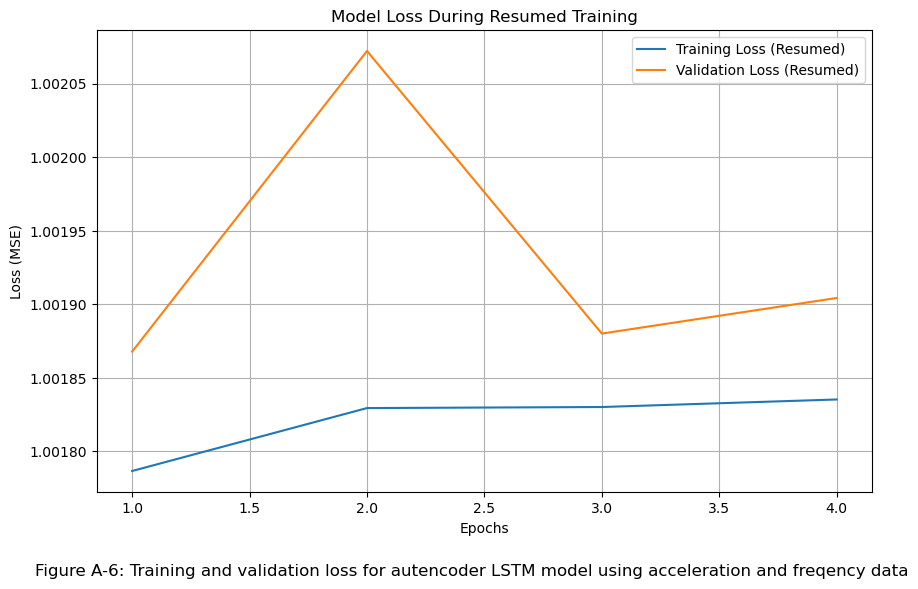


Saving final trained model to: final_lstm_autoencoder_model.h5
Final model saved.


/shared/courseSharedFolders/142601outer/142601/cs109b/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [21]:
epochs_run_resumed = range(initial_epoch_to_start_from, initial_epoch_to_start_from + len(history.history['loss']))

# Plot training history
plt.figure(figsize=(10, 6))
plt.plot(epochs_run_resumed, history.history['loss'], label='Training Loss (Resumed)')
plt.plot(epochs_run_resumed, history.history['val_loss'], label='Validation Loss (Resumed)')
plt.title('Model Loss During Resumed Training')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure A-6: Training and validation loss for autencoder LSTM model using acceleration and freqency data', ha='center', fontsize=12)

plt.show()


final_model_path = 'final_lstm_autoencoder_model.h5'
print(f"\nSaving final trained model to: {final_model_path}")
model.save(final_model_path)
print("Final model saved.")

1082/1082 [==============================] - 75s 69ms/step


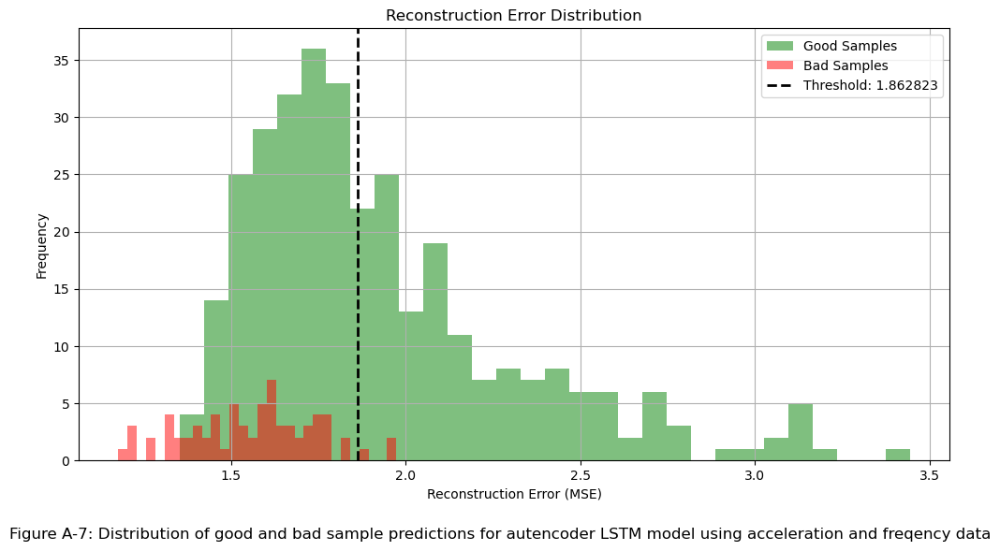

Accuracy on good samples: 44.95%
Accuracy on bad samples: 95.71%
Overall accuracy: 53.90%


In [22]:
# Prepare test data (both good and bad samples)
def evaluate_sequences(data_list, window_size=2048, step=1024):
    all_errors = []
    for sample in data_list:
        windows = []
        for i in range(0, len(sample) - window_size + 1, step):
            windows.append(sample[i:i+window_size])
        
        if not windows:  # Skip if sample is too short
            continue
            
        windows = np.array(windows)
        
        # Get predictions and errors for all windows
        predictions = model.predict(windows, verbose=0)
        mse = np.mean(np.square(windows - predictions), axis=(1, 2))
        
        # Store maximum error for this sample
        all_errors.append(np.max(mse))
    
    return np.array(all_errors)

X_val = create_windowed_sequences(good_val, window_size, step)

# Get reconstruction error on validation set
val_predictions = model.predict(X_val)
val_mse = np.mean(np.square(X_val - val_predictions), axis=(1, 2))

# Set threshold based on validation error distribution
# Common approach: mean + n * std
# threshold = np.mean(val_mse) + 3 * np.std(val_mse)
threshold = np.percentile(val_mse, 97)

# Evaluate both good and bad test samples
good_test_errors = evaluate_sequences(good_val, window_size, step) 
bad_test_errors = evaluate_sequences(bad_X_mag_normalized, window_size, step)

# Plot error distributions
plt.figure(figsize=(12, 6))
plt.hist(good_test_errors, bins=30, alpha=0.5, label='Good Samples', color='green')
plt.hist(bad_test_errors, bins=30, alpha=0.5, label='Bad Samples', color='red')
plt.axvline(threshold, color='black', linestyle='dashed', linewidth=2, label=f'Threshold: {threshold:.6f}')
plt.title('Reconstruction Error Distribution')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.figtext(0.5, -0.03, 'Figure A-7: Distribution of good and bad sample predictions for autencoder LSTM model using acceleration and freqency data', ha='center', fontsize=12)

plt.show()

# Calculate performance metrics
good_predictions = good_test_errors > threshold
bad_predictions = bad_test_errors <= threshold

good_accuracy = np.mean(good_predictions)
bad_accuracy = np.mean(bad_predictions)

print(f"Accuracy on good samples: {good_accuracy:.2%}")
print(f"Accuracy on bad samples: {bad_accuracy:.2%}")
print(f"Overall accuracy: {(np.sum(good_predictions) + np.sum(bad_predictions)) / (len(good_predictions) + len(bad_predictions)):.2%}")